# SMC in the Frequency Domain for Long-Memory Processes

## Libraries Importing

In [749]:
# Numerical and Data libraries
import os
import csv
import json
import numpy as np
import numpy.polynomial as Poly
import pandas as pd
from random import random, gauss, shuffle
from math import pi,exp,log,sqrt,gamma,floor,ceil
import cmath
import time
import datetime
import itertools
from itertools import islice
from collections import Counter
import warnings

# Time Series libraries
from statsmodels.graphics.tsaplots import acf, plot_acf, plot_pacf
import statsmodels.api as sm
#from statsmodels.tsa import arma_generate_sample
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_model import ARIMA
import scipy as sp
from scipy import signal
from scipy.fft import fft, fftshift
from scipy.stats import truncnorm, halfnorm, invgamma
import scipy.stats as stats

# Plotting libraries
from IPython.display import display, Math, Image, HTML, Markdown
import tables
import tabulate
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
import pylab
import seaborn as sns
%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 300

# define ranndom number generator with specific seed for certain
# reproducible results (do not define seed globally)
rng = np.random.RandomState(2022)
# call this as e.g. rng.random(4) = array([0.75694783, 0.94138187, 0.59246304, 0.31884171])

# to display latex table
#display(HTML("<script src='https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.3/"
             #"latest.js?config=default'></script>"))


In [277]:
#np.random.seed(1)

<a name="outline"></a>

## Outline

- [1](#section-1): Time Series Data
  - [1.1](#11) Data Importing
  - [1.2](#12) Data Pre-Processing and Plotting
- [2](#section-2): Time Series Functions
  - [2.1](#21) Fourier Frequencies and Periodogram
  - [2.2](#22) Spectral Density Function (SDF)
  - [2.3](#23) Whittle Loglikelihood
- [3](#section-3): Auxiliary Functions and Testing
  - [3.1](#31) Extract Parameters
  - [3.2](#32) Plot SDF (with Periodogram and Spectral Peaks)
  - [3.3](#33) Test all Functions
- [4](#section-4): Bayesian Setup
  - [4.1](#41) Parameter Bounds
  - [4.2](#42) Prior, Likelihood, and Posterior
  - [4.3](#43) Sampling Functions
- [5](#section-5): SMC Sampler
  - [5.1](#51) SMC Functions
    - [5.1.1](#511) Particle Initialization
    - [5.1.2](#512) Bridging Densities
    - [5.1.3](#513) MCMC Proposal
    - [5.1.4](#514) ESS and Resampling
    - [5.1.5](#515) SMC Sampler (Master Function)
  - [5.2](#52) Post-Processing
    - [5.2.1](#521) Plots and Tables
    - [5.2.2](#522) Post-Processing Pipeline
  - [5.3](#53) Input and Output (Running the Sampler)
    - [5.3.1](#531) Data and Model Selection (Input)
    - [5.3.2](#532) Prior Specification and Particle Initialization
    - [5.3.3](#533) Running the SMC Sampler (Output)
    - [5.3.4](#534) Post-Processing (Plots and Diagnostics)
- [6](#section-6): Simulation
  - [6.1](#61) AR and MA polynomial reconstruction
  - [6.2](#62) ARMA Simulation
  - [6.3](#63) General Simulation from Spectrum
  - [6.4](#64) GARMA Simulation from Functional Form
  - [6.5](#65) Forecasting
  - [6.6](#66) Saving Simulated Data
    - [6.6.1](#661) ARMA(3,3)
    - [6.6.2](#662) ARFIMA(0,0.4,0)
    - [6.6.3](#663) 1-Factor Gegenbauer
    - [6.6.4](#664) GARMA(5,1,3)
- [7](#section-7): Other Figures from Article


<a name="section-1"></a>
# 1: Time Series Data [^](#outline)

<a name="11"></a>

## 1.1 Data Importing [^](#outline)

#### I. Monthly Electricity Retail Sales

In [9]:
US_Electricity_Data = pd.read_csv("~/Desktop/M4R/M4R Data/US Electricity Data/US_Electricity_Data.csv")
time_elec_sales_monthly = US_Electricity_Data.loc[:,'time']
x_elec_sales_monthly = US_Electricity_Data.loc[:,'all']

#### II. Hourly Electricty Demand (Feb 2021)

In [10]:
elec_hourly_Feb21 = pd.read_csv("~/Desktop/M4R/M4R Data/Hourly US48 Electricity Demand/elec_hourly_Feb21.csv")
time_elec_hourly_Feb21 = elec_hourly_Feb21.loc[:,'Timestamp (Hour Ending)']
x_elec_hourly_Feb21 = elec_hourly_Feb21.loc[:,'Demand (MWh)']

#### III. US MoM CPI (Jan 1980 - May 2022)

In [1144]:
# Not Seasonally Adjusted
US_CPI_Data = pd.read_csv("~/Desktop/M4R/M4R Data/US CPI Data/US_CPI.csv")
US_CPI_Data = US_CPI_Data[28:] # May 1982-Apr 2022 (480 entries)
time_cpi = US_CPI_Data.loc[:,'time']
x_cpi = US_CPI_Data.loc[:,'MoM']
# Seasonally-Adjusted
US_CPI_Data_SA = pd.read_csv("~/Desktop/M4R/M4R Data/US CPI Data/US_CPI_SA.csv")
US_CPI_Data_SA = US_CPI_Data_SA[28:] # May 1982-Apr 2022 (480 entries)
time_cpi_sa = US_CPI_Data_SA.loc[:,'time']
x_cpi_sa = US_CPI_Data_SA.loc[:,'MoM']

#### IV. R Datasets:
- Monthly Electricity Production
- Half-Hourly Electricity Production
- UK Retail Sales

In [11]:
# R built-in datasets
common_filepath = '/Users/mateipapahagi/Desktop/M4R/M4R Data/R Datasets/'

# Monthly Electricity Production
Monthly_Electricity_Production = pd.read_csv(common_filepath+'Monthly_Electricity_Production.csv')
time_prod_monthly = Monthly_Electricity_Production.iloc[:,0]
x_prod_monthly = Monthly_Electricity_Production.iloc[:,1]

# Half-Hourly Electricity Production
Half_Hourly_Electricity_Data = pd.read_csv(common_filepath+'Half_Hourly_Electricity_Data(Taylor).csv')
time_elec_half_hourly = Half_Hourly_Electricity_Data.iloc[:,0]
x_elec_half_hourly = Half_Hourly_Electricity_Data.iloc[:,1]

# UK Retail Sales
UK_Retail_Data = pd.read_csv(common_filepath+'UK_Retail_Data.csv')
time_retail_sales = UK_Retail_Data.iloc[:,0]
x_retail_sales = UK_Retail_Data.iloc[:,1]

#### V. Google Trends Searches for the Word "Holiday"

In [939]:
Google_Trends_Holiday_Data = pd.read_csv("~/Desktop/M4R/M4R Data/Google Trends Data/google_trends_holiday_uk_weekly.csv")
time_holiday = Google_Trends_Holiday_Data.iloc[:,0]
x_holiday = Google_Trends_Holiday_Data.iloc[:,1]

#### VI. Simulated Time Series:
- ARMA(3,3) with complex and real roots
- 1-factor Gegenbauer process
- GARMA(5,1,3) process

In [250]:
# Simulated Datasets (see Section 6)
sim_filepath = '/Users/mateipapahagi/Desktop/M4R/M4R Data/Simulated Data/'
# ARMA(3,3) with complex and real roots
x_arma_1111 = pd.read_csv(sim_filepath + 'ARMA_1111_500.csv',header=None).iloc[:,0]
arma_1111_model = pd.read_csv(sim_filepath + 'ARMA_1111_coef',header=None)
S_arma_1111 = pd.read_csv(sim_filepath + 'ARMA_1111_sdf.csv',header=None).values.flatten()
param_true_arma_1111 = json.loads(arma_1111_model.iloc[-1,-1])

# 1-factor Gegenbauer process
x_gegenbauer_1 = pd.read_csv(sim_filepath + 'Gegenbauer_1_500.csv',header=None).iloc[:,0]
gegenbauer_1_model = pd.read_csv(sim_filepath + 'Gegenbauer_1_coef',header=None)
S_gegenbauer_1 = pd.read_csv(sim_filepath + 'Gegenbauer_1_sdf.csv',header=None).values.flatten()
param_true_gegenbauer_1 = json.loads(gegenbauer_1_model.iloc[-1,-1])

# GARMA(5,1,3) process
x_garma_12111 = pd.read_csv(sim_filepath + 'GARMA_12111_500.csv',header=None).iloc[:,0]
garma_12111_model = pd.read_csv(sim_filepath + 'GARMA_12111_coef',header=None)
S_garma_12111 = pd.read_csv(sim_filepath + 'GARMA_12111_sdf.csv',header=None).values.flatten()
param_true_garma_12111 = json.loads(garma_12111_model.iloc[-1,-1])

# GARMA(3,2,2) process
x_garma_11012 = pd.read_csv(sim_filepath + 'GARMA_11012_500.csv',header=None).iloc[:,0]
garma_11012_model = pd.read_csv(sim_filepath + 'GARMA_11012_coef',header=None)
S_garma_11012 = pd.read_csv(sim_filepath + 'GARMA_11012_sdf.csv',header=None).values.flatten()
param_true_garma_11012 = json.loads(garma_11012_model.iloc[-1,-1])

#### Plot All Datasets

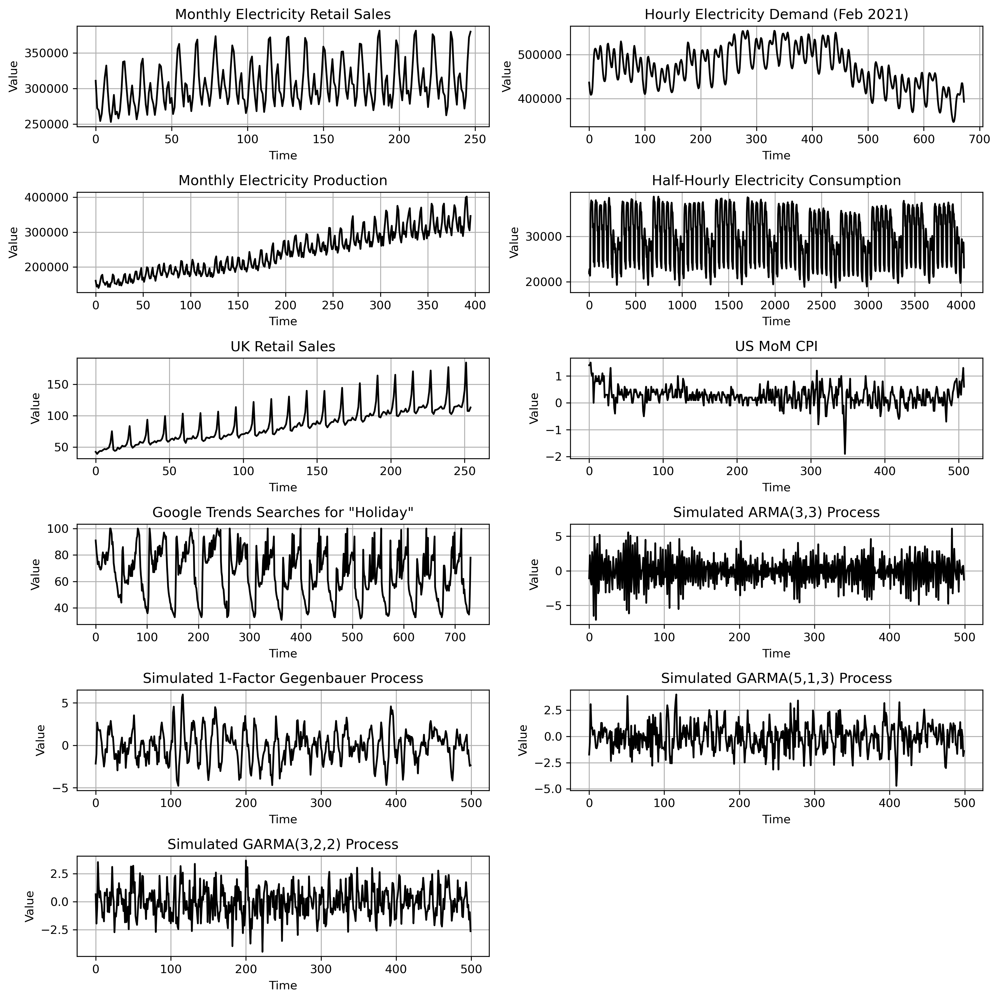

In [1105]:
# plot all datasets
time_series_list = [x_elec_sales_monthly,x_elec_hourly_Feb21,x_prod_monthly,x_elec_half_hourly,x_retail_sales,x_cpi,x_holiday,x_arma_1111,x_gegenbauer_1,x_garma_12111,x_garma_11012]
time_series_names = ['Monthly Electricity Retail Sales','Hourly Electricity Demand (Feb 2021)',
'Monthly Electricity Production','Half-Hourly Electricity Consumption','UK Retail Sales','US MoM CPI',
'Google Trends Searches for "Holiday"','Simulated ARMA(3,3) Process','Simulated 1-Factor Gegenbauer Process','Simulated GARMA(5,1,3) Process','Simulated GARMA(3,2,2) Process']
n_time_series = len(time_series_list)

fig = plt.figure(figsize=(12,12))
i=0
for n in range(n_time_series):
    i+=1
    ax = fig.add_subplot(ceil(n_time_series/2),2,i)
    ax.plot(time_series_list[n],color='black')
    plt.title(time_series_names[n])
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.grid()
plt.tight_layout()
pylab.show()

<a name="12"></a>

## 1.2 Data Pre-Processing and Plotting [^](#outline)

### Pre-processing Pipeline

In [15]:
# min-max normalise a time series
def normalise(ts,as_list=False):
    ts = np.array(ts)
    min, max = np.min(ts), np.max(ts)
    ts = (ts - min)/(max - min)
    if as_list==True: return list(ts)
    return ts

# subtract mean to make zero-mean
def demean(ts,as_list=False):
    ts = np.array(ts)
    mean = np.mean(ts)
    ts = ts - mean
    if as_list==True: return list(ts)
    return ts

# mean-variance standardise a time series (not recommended, 
# as we are not estimating the variance)
def standardise(ts,as_list=False):
    ts = np.array(ts)
    mean, std = np.mean(ts), np.std(ts)
    ts = (ts - mean)/std
    if as_list==True: return list(ts)
    return ts

# Box-Cox transformation with automatic lambda detection
# for normalising the variance across the data for heteroskedastic time series
def box_cox(ts,as_list=False):
    ts = np.array(ts)
    ts = stats.boxcox(ts)[0]
    if as_list==True: return list(ts)
    return ts

# general pre-processing pipeline
def pre_process_ts(ts,normal=True,zeromean=False,standard=False,boxcox=False,n_differences=0,as_list=False,force_even=True):
    ts = np.array(ts)
    # first do box-cox for heteroskedastic data
    if boxcox == True:
        ts = box_cox(ts)
    # then difference
    if n_differences > 0:
        for _ in range(n_differences):
            ts = pd.Series(ts)
            ts = ts.diff().dropna()
        ts = np.array(ts)
    # then either normalise, demean, or standardise
    if normal == True:
        ts = normalise(ts)
    if zeromean == True:
        ts = demean(ts)
    if standard == True: # avoid using this when estimating the std
        ts = standardise(ts)
    # eliminate the last value if the time series has odd length
    if force_even == True and len(ts)%2==1:
        ts = ts[:-1]
    if as_list: return list(ts)
    return ts

### Plotting Functions

In [16]:
def multi_ts_plot(ts1,*args):
    # plot (up to 2 at the moment) time series and their periodograms
    assert len(args) <= 1
    fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))
    color_vals = ['red','blue']
    label_vals = ['Original / Simulated TS','Estimated TS']
    # time series plot
    ax1.plot(ts1,alpha=0.5,color=color_vals[0])
    if len(args)>0: ax1.plot(args[0],alpha=0.5,color=color_vals[1])
    # periodogram plot
    f1,Z1 = signal.periodogram(ts1,window='boxcar',scaling='spectrum')
    ax2.bar(f1,Z1,width=0.003,color=color_vals[0],alpha=0.5)
    if len(args)>0:
        f2,Z2 = signal.periodogram(args[0],window='boxcar',scaling='spectrum')
        ax2.bar(f2,Z2,width=0.003,color=color_vals[1],alpha=0.5)
    ax1.set_title('Time Series',fontsize=16)
    ax2.set_title('Periodogram',fontsize=16)
    col_legends = [mpatches.Patch(color=color_vals[i], label=label_vals[i]) for i in range(2)]
    if len(args)>0:
        ax1.legend(handles = col_legends, prop={'size': 8})
        ax2.legend(handles = col_legends, prop={'size': 8})
    fig.tight_layout()

In [1514]:
def ts_plot3(ts,n_lags=None,title=""):
    # plot one time series, its periodogram, and its acf
    if n_lags == None: n_lags = len(ts)//2
    plt.figure(figsize=(12, 6))
    # time series
    ax1 = plt.subplot(2,2,1)
    ax1.plot(ts)
    # periodogram
    ax2 = plt.subplot(2,2,2)
    f,Z = signal.periodogram(ts,window='boxcar',scaling='density')
    ax2.bar(f,Z,width=0.003)
    # acf
    ax3 = plt.subplot(2,1,2)
    plot_acf(ts,lags=n_lags,ax=ax3,bartlett_confint=False,alpha=0.99)
    plt.margins(x=0)
    # titles and other configs
    ax1.set_title('Time Series',fontsize=16)
    ax1.set_xlabel('Time',fontsize=12)
    ax2.set_title('Periodogram',fontsize=16)
    ax2.set_xlabel('Frequency',fontsize=12)
    ax3.set_title('Autocorrelation Sequence',fontsize=16)
    ax3.set_xlabel('Lag',fontsize=12)
    plt.suptitle(title, fontsize=20)
    plt.tight_layout()
    #plt.show()

### RUN to choose, process, and plot the dataset

mean:  -7.401486830834377e-18 
 std dev:  0.3259201051339969


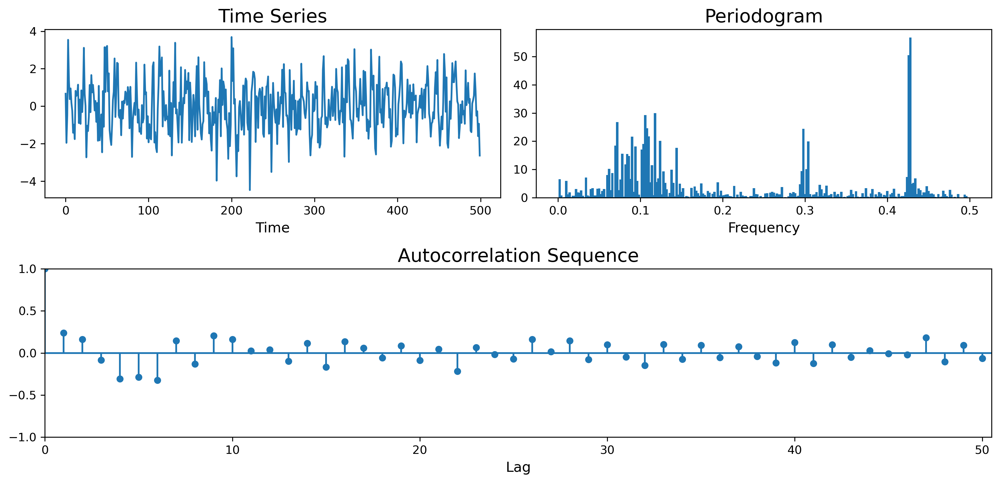

In [1537]:
# choose and pre-process the dataset
x = x_cpi #x_arma_1111 #x_cpi #x_elec_hourly_Feb21 #x_garma_11012
y = pre_process_ts(x,zeromean=True,normal=False,standard=False,n_differences=0) #y = pre_process_ts(x,normal=False,standard=True,n_differences=1)
print("mean: ",np.mean(y),'\n',"std dev: ",np.std(y))
ts_plot3(x_garma_11012,n_lags=50,title="")

In [1276]:
# Test for stationarity
stationarity_result = adfuller(y)
print('ADF Statistic: %f' % stationarity_result[0])
print('p-value: %f' % stationarity_result[1])
print('Critical Values:')
for key, value in stationarity_result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -3.981358
p-value: 0.001511
Critical Values:
	1%: -3.444
	5%: -2.868
	10%: -2.570


<a name="section-2"></a>
# 2: Time Series Functions [^](#outline)

<a name="21"></a>

## 2.1 Fourier Frequencies and Periodogram [^](#outline)

In [1154]:
# Function to calculate the Fourier frequencies and Periodogram 
def S_p_vec(y,tapered=False,taper='hann',force_even=False,welch=False,spectrum_scale=False,as_list=False):
  
  # Note: scaling == 'spectrum' divides the periodogram by 2*len(freqs)=2*(J+1) for scipy
  if spectrum_scale == True: scale = 'spectrum' # use this to normalise the periodogram by the length of the TS
  else: scale = 'density' # use this to have periodogram on the same scale as the SDF
  
  # option to use Welch's method
  if welch == True:
    freqs, periodogram = signal.welch(y, return_onesided=True, noverlap=0, scaling=scale)
  else:
    if tapered == True: # apply a Hann taper (other options include: 'triang','hamming','exponential')
      freqs, periodogram = signal.periodogram(y,window=taper,scaling=scale)
    else:
      freqs, periodogram = signal.periodogram(y,window='boxcar',scaling=scale) # otherwise use rectangular/boxcar window
  
  # scale by the variance of the time series
  # to bring SDF and periodogram on the same scale (very important)
  periodogram = periodogram/np.var(y)
  
  # option to make as list
  if as_list == True: freqs, periodogram = list(freqs), list(periodogram)
  
  # option to make of even length
  if force_even == True and len(periodogram)%2 == 1:
    return freqs[:-1], periodogram[:-1]

  return freqs, periodogram

### RUN Fourier frequencies and Periodogram

Text(0, 0.5, 'Tapered Periodogram')

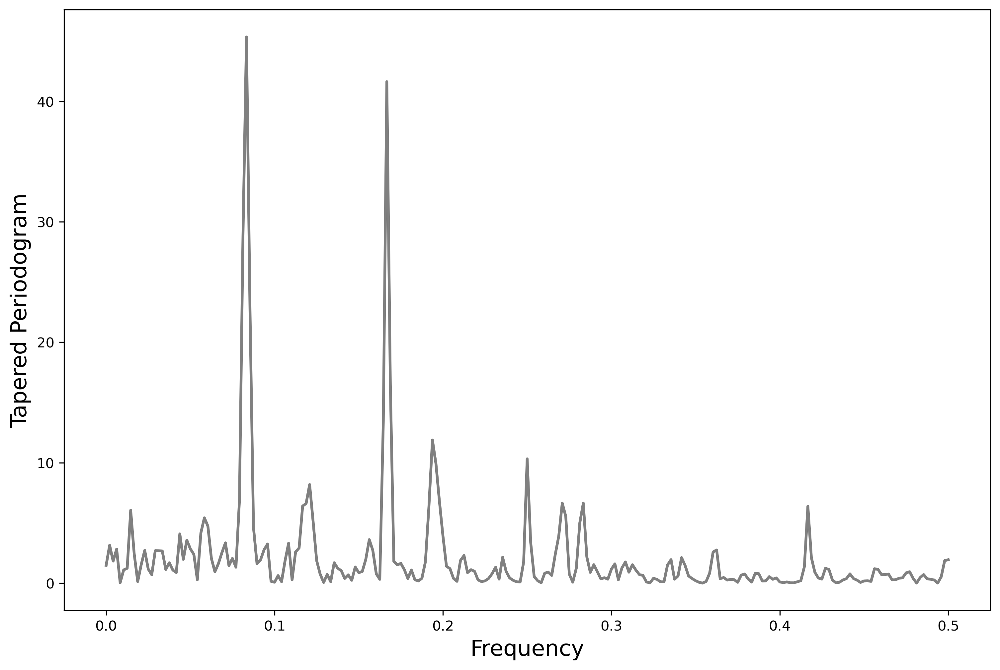

In [1451]:
# MUST RUN
f, Z = S_p_vec(y,tapered=True,taper='hann') 
#S_p_vec(y,tapered=False) #S_p_vec(y,tapered=True,taper='hann')
data = (f,Z)

plt.plot(f, Z,linewidth=2,color='gray')
#plt.bar(f,Z,width=0.003,color='gray')
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Tapered Periodogram",fontsize=16)

<a name="22"></a>

## 2.2 Spectral Density Function (SDF) [^](#outline)

$$
\begin{align*}
S_Y(f)&=\sigma_\epsilon^2\frac{\prod_{j=1}^q\big|1-\xi_{2j}e^{2\pi i f} \big|^2}{\prod_{j=1}^p\big|1-\xi_{1j}e^{2\pi i f} \big|^2}\frac{1}{\prod_{j=1}^k[4\{\cos(2\pi f)-\lambda_j\}^2]^{\delta_j}} \\ 
&=\sigma_\epsilon^2\frac{\prod_{j=1}^{Rq}\big|1-\alpha_{2j}e^{2\pi i f} \big|^2 \prod_{j=1}^{Cq}\big|(1-\alpha^*_{2j}e^{2\pi i f - \omega^*_{2j}})(1-\alpha^*_{2j}e^{2\pi i f + \omega^*_{2j}}) \big|^2}{\prod_{j=1}^{Rp}\big|1-\alpha_{1j}e^{2\pi i f} \big|^2 \prod_{j=1}^{Cp}\big|(1-\alpha^*_{1j}e^{2\pi i f - \omega^*_{1j}})(1-\alpha^*_{1j}e^{2\pi i f + \omega^*_{1j}}) \big|^2}\frac{1}{\prod_{j=1}^k[4\{\cos(2\pi f)-\lambda_j\}^2]^{\delta_j}}
\end{align*}
$$

In [21]:
## Function to compute complex conjugate AR and MA roots based on arguments and moduli
def xi_builder(alpha,omega):
  # firstly, sort alpha and omega
  alpha = np.sort(alpha)
  omega = np.sort(omega)
  # count the number of real roots (corresp to omega=0)
  # and the number of complex roots (omega!=0)
  R = sum(omega == 0)
  C = sum(omega != 0)
  # initialize xi
  xi=np.zeros(R+2*C,dtype='complex_')
  j = 0
  if (len(omega)>0):
    for i in range(len(omega)):
      # real roots
      if (omega[i] == 0):
        xi[j] = alpha[i]
        j = j+1
      # complex conjugate roots
      else:
        xi[j] = alpha[i]*cmath.exp(2j*pi*omega[i])
        xi[j+1] = alpha[i]*cmath.exp(-2j*pi*omega[i])
        j = j+2
  return(xi)

In [1060]:
## Spectral density function (SDF)
def S_Y(f,alpha1,omega1,alpha2,omega2,Lambda,delta,sigma_epsilon,p,q,k):
# alpha1 and omega1 have length Rp+Cp
# alpha2 and omega2 have length Rq+Cq
 
  # build the complex reciprocal roots
  xi1 = xi_builder(alpha1,omega1) # has length p=Rp+2*Cp
  xi2 = xi_builder(alpha2,omega2) # has length q=Rq+2*Cq
  
  # MA component
  if (q!=0):
    MA_multiplicands = [1-xi2*cmath.exp(2j*pi*f) for xi2 in xi2]
    MA_factor = np.prod(np.abs(MA_multiplicands)**2)
  
  else: MA_factor = 1
  
  # AR component
  if (p!=0):
    AR_multiplicands = [1-xi1*cmath.exp(2j*pi*f) for xi1 in xi1]
    AR_factor = np.prod(np.abs(AR_multiplicands)**2)

  else: AR_factor = 1
  
  # Gegenbauer component
  if(k!=0):
    G_multiplicands = np.power(4*np.square(np.cos(2*pi*f)-np.array(Lambda)),delta)
    G_factor = np.prod(G_multiplicands)

  else: G_factor = 1

  return sigma_epsilon*(MA_factor/AR_factor*1/G_factor)
  #return(MA_factor/AR_factor*1/G_factor)

# vectorized version
def S_Y_vec(f,alpha1,omega1,alpha2,omega2,Lambda,delta,sigma_epsilon,p,q,k,as_list=False):
  SDF = [S_Y(f,alpha1,omega1,alpha2,omega2,Lambda,delta,sigma_epsilon,p,q,k) for f in f]
  if as_list == True: return SDF
  return np.array(SDF)

<a name="23"></a>

## 2.3 Whittle Loglikelihood [^](#outline)

$$
l(\boldsymbol\eta|Z) = -\sum_{j=1}^J\bigg[\log\{S_Y(f_j)\}+\frac{Z_j}{S_Y(f_j)}\bigg]-\frac{1}{2}\bigg[\frac{Z_0}{S_Y(f_0)}+\frac{Z_J}{S_Y(f_J)}+\log\{Z_0 S_Y(f_0)\}+\log\{Z_J S_Y(f_J)\} \bigg]
$$
where $\boldsymbol\eta$ is the vector of parameters
$$
\begin{align*}
\boldsymbol\eta=(&\alpha_{11},\dots,\alpha_{1R_p},\alpha_{11}^*,\dots,\alpha_{1C_p}^*,\omega_{11},\dots,\omega_{1R_p},\omega_{11}^*,\dots,\omega_{1C_p}^*, \\
&\alpha_{21},\dots,\alpha_{2R_q},\alpha_{21}^*,\dots,\alpha_{2C_q}^*,\omega_{21},\dots,\omega_{2R_q},\omega_{21}^*,\dots,\omega_{2C_q}^*, \\
&\delta_{11},\dots,\delta_{1k},\lambda_{11},\dots,\lambda_{1k},\sigma_\epsilon^2)
\end{align*} 
$$
and $Z=\big(Z_0=\hat{S}_p(f_0)\dots,Z_J=\hat{S}_p(f_J)\big)$ is the vector of periodogram values evaluated at the Fourier frequencies $f_j=\frac{j}{N},\quad j\in{\{0,1,...,J=N/2\}}$.


In [23]:
def Fejer(f,sampling_interval=1,N=None):
    if N is None: N = len(f); assert N>0
    #if f[0] == 0:
        #F = sampling_interval/(2*pi*n)*(np.sin(n*f[1:]*sampling_interval/2)**2)/(np.sin(f[1:]*sampling_interval/2)**2)
        #F = np.insert(F,0,sampling_interval*n/(2*pi))
    #else:
    warnings.filterwarnings('ignore') # ignore division by 0 in sin(0)/sin(0)
    F = sampling_interval*(np.sin(N*f*pi*sampling_interval)**2)/(N*np.sin(f*pi*sampling_interval)**2)
    if 0 in f: 
        zero_index = np.where(f == 0)[0][0]
        F[zero_index] = sampling_interval*N/(2*pi)
    return F

In [1061]:
def W_l(f,Z,
        alpha1R, alpha1C, omega1C,
        alpha2R, alpha2C, omega2C,
        Lambda, delta, sigma_epsilon,
        Rp,Cp,Rq,Cq,k,
        normal=False,correction=False,
        debiased=False, debiasing_type=1,
        return_terms=False):
    ## Whittle loglikelihood (master function)
    '''
    parameters alpha and omega must be lists
    return the Whittle loglikelihood
    Options (bool):
    - debiased: performs debiasing as in Sykulski (2019)
                debiasing_type = 1 does so via direct convolution with Fejer's kernel
                debiasing_type = 2 does so using the formula based on the autocovariance
    - normal (experimental): normalises the periodogram and the sdf to the range [0,1] to improve stability of the ratio
    - correction: adds the correction term from McCoy & Stephens (2004)
    - return_terms: return the Whittle loglikelihood and its components in a dictionary
    '''
    assert len(f) == len(Z)
    assert len(alpha1R) == Rp
    assert len(alpha1C) == len(omega1C) == Cp
    assert len(alpha2R) == Rq
    assert len(alpha2C) == len(omega2C) == Cq
    assert len(Lambda) == len(delta) == k
    # build the parameters for the SDF
    p = Rp + 2*Cp
    q = Rq + 2*Cq
    alpha1 = alpha1R + alpha1C
    omega1R = [0]*Rp
    omega1 = omega1R + omega1C
    alpha2 = alpha2R + alpha2C
    omega2R = [0]*Rq
    omega2 = omega2R + omega2C

    # Evaluate the SDF at the Fourier frequencies:
    if debiased == True:
        Delta = 1
        n = 2*(len(f)-1) # equal to the length of the original data
        omega_freqs = 1/(n*Delta)*np.arange(-ceil(n/2)+1,floor(n/2)+1)

        # variant 1 - direct convolution with Fejer's kenel – formula (8) in Syklski
        if debiasing_type==1:
            S_Y_f = S_Y_vec(omega_freqs,alpha1,omega1,alpha2,omega2,
                    Lambda,delta,sigma_epsilon,p,q,k)
            S_Y_f = np.convolve(S_Y_f,Fejer(omega_freqs),mode='same')
            S_Y_f = S_Y_f[(n//2-1):]/n # take only right side of symmetric spectrum

        # variant 2 – time-domain multiplications – formula (9) in Sykulski
        elif debiasing_type==2:
            # seems to give same result as no debiasing
            S_Y_f = S_Y_vec(f,alpha1,omega1,alpha2,omega2,
                    Lambda,delta,sigma_epsilon,p,q,k)
            acvs = np.fft.irfft(S_Y_f)
            fft_sum = np.array([sum([(1-tau/n)*acvs[tau]*cmath.exp(-1j*2*pi*f*tau*Delta) for tau in range(0,n-1)]) for f in omega_freqs])
            S_Y_f = 2*Delta*fft_sum.real - Delta * acvs[0]
            S_Y_f = S_Y_f[(n//2-1):] # take only right side of symmetric spectrum

    else:
        S_Y_f = S_Y_vec(f,alpha1,omega1,alpha2,omega2,
                Lambda,delta,sigma_epsilon,p,q,k)
    
    # optional: bring the SDF and periodogram to the same scale 
    # by normalising both to [0,1] (as only the relative magnitude at same location matters)
    if normal == True:
        S_Y_f = normalise(S_Y_f,as_list=True)
        Z = normalise(Z,as_list=True)

    # define regularized log and division functions to deal with zeros:
    def Div(x,y):
        return x / max(y,1e-15)
    def Log(x):
        return log(max(x,1e-15))
    
    # build the summands for the sum from j=1 to J-1
    l_summands = [Log(s) + Div(z,s) for s, z in zip(S_Y_f, Z)]

    if correction == True:
        W_l = -sum(l_summands[1:-1])-1/2*(Div(Z[0],S_Y_f[0])+Div(Z[-1],S_Y_f[-1])+Log(Z[0]*S_Y_f[0])+Log(Z[-1]*S_Y_f[-1]))
        #older: W_l = -sum(l_summands[1:(J-1)])-1/2*(Div(Z[0],S_Y_f[0])+Div(Z[(J)],S_Y_f[(J)]) +Log(Z[0]*S_Y_f[0])+Log(Z[(J)]*S_Y_f[(J)]))
    else: W_l = -sum(l_summands)

    # optional: analyse which components contribute most to the likelihood
    if return_terms == True:
        return {'W_l':W_l,
        'l_summands':l_summands,
        'S_Y_f':S_Y_f,
        'Z':Z,
        'Log(S_Y_f)':[Log(s) for s in S_Y_f],
        'Z/S_Y_f':[Div(z,s) for s, z in zip(S_Y_f, Z)],
        'Z0/S_f0':Div(Z[0],S_Y_f[0]),
        'ZJ/S_fJ':Div(Z[-1],S_Y_f[-1]),
        'Log(Z0*S_f0)':Log(Z[0]*S_Y_f[0]),
        'Log(ZJ*S_fJ)':Log(Z[-1]*S_Y_f[-1])}
    
    return W_l

<a name="section-3"></a>
# 3: Auxiliary Functions and Testing [^](#outline)

<a name="31"></a>

## 3.1 Extract Parameters [^](#outline)

In [26]:
## Function to collect parameters from output parameter vector

def extract_parameters(param,Rp,Cp,Rq,Cq,k,merged=False,display=False):

  '''
  Parameters are extracted from the sampling output vector, 
  which is of the form:
  param = (alpha1R,alpha1C,omega1C,alpha2R,alpha2C,omega2C,lambda,delta, sigma_epsilon)

  The result is :
  (alpha1,omega1,alpha2,omega2,lambda,delta,sigma_epsilon) if merged is True
  (alpha1R,alpha1C,omega1R,omega1C,alpha2R,alpha2C,omega2R,omega2C,lambda,delta,sigma_epsilon) if merged is False
  '''
  
  split_chunks = [Rp, Cp, Cp, Rq, Cq, Cq, k, k, 1]
  it = iter(param)
  param_list = [list(islice(it, i)) for i in split_chunks]
  
  alpha1R = param_list[0]
  alpha1C = param_list[1]
  alpha1 = alpha1R + alpha1C

  omega1R = [0]*Rp
  omega1C = param_list[2]
  omega1 = omega1R + omega1C

  alpha2R = param_list[3]
  alpha2C = param_list[4]
  alpha2 = alpha2R + alpha2C

  omega2R = [0]*Rq
  omega2C = param_list[5]
  omega2 = omega2R + omega2C
  
  Lambda = param_list[6]
  delta = param_list[7]
  
  sigma_epsilon = param_list[8]
  
  if (display==True):
    print("alpha1R: ",alpha1R,"\n")
    print("alpha1C: ",alpha1C,"\n")
    print("omega1R: ",omega1R,"\n")
    print("omega1C: ",omega1C,"\n")
    print("alpha2R: ",alpha2R,"\n")
    print("alpha2C: ",alpha2C,"\n")
    print("omega2R: ",omega2R,"\n")
    print("omega2C: ",omega2C,"\n")
    print("lambda: ",Lambda,"\n")
    print("delta: ",delta,"\n")
    print("sigma_epsilon: ",sigma_epsilon,"\n")
  
  if merged == False:
    # remove sigma_epsilon list entry and replace with single value
    return param_list[:-1]+sigma_epsilon
    #return alpha1R+alpha1C+omega1C+alpha2R+alpha2C+omega2C+Lambda+delta+sigma_epsilon
  return alpha1+omega1+alpha2+omega2+Lambda+delta+sigma_epsilon

<a name="32"></a>

## 3.2 Plot SDF (with Periodogram and Spectral Peaks) [^](#outline)

In [1348]:
## Function to plot the SDF with the periodogram and the locations of the periodogram peaks (optional)
# still has some bugs left around the AR peaks locations
# not all combinations are supported
def plot_SDF(freqs,SDF_vals,periodogram_vals=None,true_vals=None,
             with_peaks=False,Lambda=None,alpha1C=None,omega1C=None,
             log=False,align_scale=False,
             title='SDF',periodogram_display='line',estimated_legend=True):
  
  # make frequency grids with same endpoints but potentially different resolutions
  freqs_SDF = np.linspace(np.min(freqs),np.max(freqs),len(SDF_vals))
  if periodogram_vals is not None: freqs_per = np.linspace(np.min(freqs),np.max(freqs),len(periodogram_vals))
  if true_vals is not None: freqs_true = np.linspace(np.min(freqs),np.max(freqs),len(true_vals))
  
  # set plotting colours and legend labels
  color_vals = ['royalblue','dimgray','black','red','green']
  if estimated_legend == True:
    label_vals = ['Estimated Spectrum','Periodogram','True Spectrum','Estimated AR peaks','Estimated Gegenbauer peaks']
  else: label_vals = ['Spectrum','Periodogram','True Spectrum','AR peaks','Gegenbauer peaks']
  col_legends = [mpatches.Patch(color=color_vals[0], label=label_vals[0])]
  legend_length = 1
  if periodogram_vals is not None:
    legend_length += 1
    col_legends += [mpatches.Patch(color=color_vals[1], label=label_vals[1])]
  if true_vals is not None:
    legend_length += 1
    col_legends += [mpatches.Patch(color=color_vals[2], label=label_vals[2])]
  
  # option to plot on dB scale
  if (log==True):
    plt.plot(freqs_SDF,10*np.log10(SDF_vals),linewidth=2,color=color_vals[0])
    # option to plot the true spectum (for simulated processes)
    if true_vals is not None: 
      plt.plot(freqs_true,10*np.log10(true_vals),linewidth=2,linestyle='dashed',color=color_vals[2])
  else:
    plt.plot(freqs_SDF,SDF_vals,linewidth=2,color=color_vals[0])
    # option to plot the true spectum (for simulated processes)
    if true_vals is not None:  
      plt.plot(freqs_true,true_vals,linewidth=2,linestyle='dashed',color=color_vals[2])
  
  # option to plot the periodogram
  if periodogram_vals is not None:
    # option to align scales (should be aligned anyway by construction)
    if align_scale == True:
      scaling=np.max(periodogram_vals)/np.max(SDF_vals)
      #scaling = np.max(np.divide(periodogram_vals,SDF_vals))
      print(scaling)
      periodogram_vals = periodogram_vals/scaling
    # option to plot the periodogram on log scale
    if (log==True):
      if periodogram_display=='line': plt.plot(freqs_per[1:], 10*np.log10(periodogram_vals[1:]),linewidth=1,color=color_vals[1])
      if periodogram_display=='bar': plt.bar(freqs_per[1:], 10*np.log10(periodogram_vals[1:]), width=0.002,color=color_vals[1],alpha=0.6)
    else:
      if periodogram_display=='line': plt.plot(freqs_per, periodogram_vals,linewidth=1,color=color_vals[1])
      if periodogram_display=='bar': plt.bar(freqs_per, periodogram_vals, width=0.002,color=color_vals[1],alpha=0.6)
  
  # option to plot the AR and Gegenbauer spectral peaks
  if (with_peaks == True):
    if Lambda is not None and alpha1C is not None: color_index = (3,4)
    if Lambda is None and alpha1C is not None: color_index = (3,3)
    if Lambda is not None and alpha1C is None: color_index = (3,3)
    
    # AR peaks
    if alpha1C is not None and len(alpha1C)>0 and omega1C is not None and len(omega1C)==len(alpha1C): 
      legend_length += 1
      col_legends += [mpatches.Patch(color=color_vals[color_index[0]], label=label_vals[color_index[0]])]
      AR_peak_locations = 1/(2*pi)*np.arccos(np.divide((1+np.square(alpha1C)),(2*np.array(alpha1C)))*np.cos(2*pi*np.array(omega1C)))
      #AR_peak_exponents = [alpha*np.cos(2*pi*omega)+cmath.sqrt(np.cos(2*pi*omega)**2-1)/abs(alpha) for (alpha,omega) in zip(alpha1C,omega1C)]
      #AR_peak_locations = np.array([1/(2*pi*1j)*cmath.log(u) for u in AR_peak_exponents])
      for peak_location in AR_peak_locations: plt.axvline(x=peak_location,color=color_vals[color_index[0]],linewidth=1,linestyle='dashed')

    # Gegenbauer peaks
    if Lambda is not None and len(Lambda)>0:
      legend_length += 1
      col_legends += [mpatches.Patch(color=color_vals[color_index[1]], label=label_vals[color_index[1]])]
      G_peak_locations = 1/(2*pi)*np.arccos(Lambda)
      for peak_location in G_peak_locations: plt.axvline(x=peak_location,color=color_vals[color_index[1]],linewidth=1,linestyle='dashed')
  
  # legend
  if legend_length > 1:
    #col_legends = [mpatches.Patch(color=color_vals[i], label=label_vals[i]) for i in range(legend_length)]
    plt.legend(handles = col_legends, prop={'size': 12})

  plt.xlabel("Frequency",fontsize=16)
  if (log==True): plt.ylabel('log Spectrum (dB)',fontsize=16)
  else: plt.ylabel('Spectrum',fontsize=16)
  plt.title(title,fontsize=16)


<a name="33"></a>

## 3.3 Test all Functions [^](#outline)

Model specified: GARMA ( 3 , 2 , 2 ) 

Number of parameters to estimate:  10 

alpha1R:  [0.2] 

alpha1C:  [0.9] 

omega1R:  [0] 

omega1C:  [0.1] 

alpha2R:  [] 

alpha2C:  [0.2] 

omega2R:  [] 

omega2C:  [0.1] 

lambda:  [-0.3, -0.9] 

delta:  [0.4, 0.45] 

sigma_epsilon:  [1] 

xi1:  [0.2       +0.j         0.72811529+0.52900673j 0.72811529-0.52900673j] 

xi2:  [0.1618034+0.11755705j 0.1618034-0.11755705j] 

W_l: -300.60935690398287


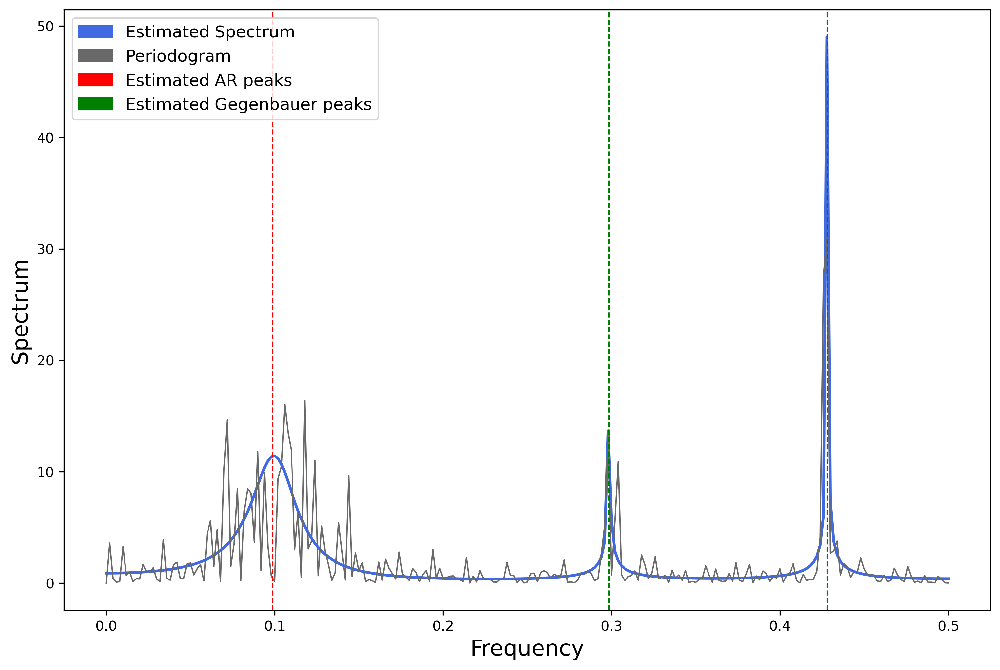

In [348]:
## Test the above functions

#Test inputs
Rp_test=1
Cp_test=1
p_test=Rp_test+2*Cp_test
# MA(q) model specification
Rq_test=0
Cq_test=1
q_test=Rq_test+2*Cq_test
# Gegenbauer(k) model specification
k_test=2
nparam_test = Rp_test+2*Cp_test+Rq_test+2*Cq_test+2*k_test+1

alpha1R_test = [0.2]#list(np.random.uniform(0,1,Rp_test))#[0.2875774]#
alpha1C_test = [0.9]#list(np.random.uniform(0,1,Cp_test))#[0.9]# # get peaks when these are close to 1
alpha1_test = alpha1R_test + alpha1C_test

omega1R_test = [0] * Rp_test
omega1C_test = [0.1]#list(np.random.uniform(0,1/2,Cp_test))#[0.3941526] #
omega1_test = omega1R_test + omega1C_test

alpha2R_test = []#list(np.random.uniform(0,1,Rq_test))#[0.4089769] #
alpha2C_test = [0.2]#list(np.random.uniform(0,1,Cq_test))#[0.8830174] #
alpha2_test = alpha2R_test + alpha2C_test

omega2R_test = [0] * Rq_test
omega2C_test = [0.1]#list(np.random.uniform(0,1/2,Cq_test))#[0.4702336] #
omega2_test = omega2R_test + omega2C_test

lambda_test = [-0.3,-0.9] #list(np.random.uniform(-1,1,k_test))#[-0.908887]#
delta_test = [0.4,0.45] #list(np.random.uniform(0,1/2,k_test))#[0.2640527]#

sigma_epsilon_test = 1 #0.19

param_test=alpha1R_test+alpha1C_test+omega1C_test+alpha2R_test+alpha2C_test+omega2C_test+lambda_test+delta_test+[sigma_epsilon_test]

print("Model specified: GARMA (",p_test,",",k_test,",",q_test,")", "\n")
print("Number of parameters to estimate: ",nparam_test, "\n")
param_list_test = extract_parameters(param_test,Rp_test,Cp_test,Rq_test,Cq_test,k_test,merged=False,display=True)

# test: note the difference between the Gegenbauer peak (left) and the AR peak (right)
xi1_test = xi_builder(alpha1_test,omega1_test)
xi2_test = xi_builder(alpha2_test,omega2_test)
print("xi1: ",xi1_test,"\n")
print("xi2: ",xi2_test,"\n")

W_l_test = W_l(f,Z,
              alpha1R_test, alpha1C_test, omega1C_test,
              alpha2R_test, alpha2C_test, omega2C_test,
              lambda_test, delta_test, sigma_epsilon_test,
              Rp_test,Cp_test,Rq_test,Cq_test,k_test)

print('W_l:',W_l_test)

S_Y_test = S_Y_vec(f,alpha1_test,omega1_test,alpha2_test,omega2_test,
      lambda_test,delta_test,sigma_epsilon_test,p_test,q_test,k_test)

plot_SDF(f,S_Y_test,with_peaks=True,Lambda=lambda_test,alpha1C=alpha1C_test,omega1C=omega1C_test,log=False,box=False,title='',periodogram_vals=Z)

In [349]:
## Inspect the components of the log-likelihood
W_l_test = W_l(f,Z,
              alpha1R_test, alpha1C_test, omega1C_test,
              alpha2R_test, alpha2C_test, omega2C_test,
              lambda_test, delta_test, sigma_epsilon_test,
              Rp_test,Cp_test,Rq_test,Cq_test,k_test,
              return_terms=True,correction=False,debiased=False,debiasing_type=2)

print('W_l:',W_l_test['W_l'])
print('exp(W_l):',exp(W_l_test['W_l']))

# check for problem here; summands should not be too far from 1
print('l_summands:',-sum(W_l_test['l_summands'][1:-1]))

# the following additive terms in the correction are not the problem
print('Z0/S_f0:',W_l_test['Z0/S_f0']) # close to 0, so not a problem
print('ZJ/S_fJ:',W_l_test['ZJ/S_fJ']) # relatively large, but not a problem
print('Log(Z0*S_f0):',W_l_test['Log(Z0*S_f0)']) 
print('Log(ZJ*S_fJ):',W_l_test['Log(ZJ*S_fJ)'])
# the problem are the values in l_summands corresponding to peaks
print('len (no. of summands):',len(W_l_test['l_summands']))
print('min ratio:',min(W_l_test['l_summands']))
print('max ratio:',max(W_l_test['l_summands']))
print('mean ratio:',np.mean(W_l_test['l_summands']))
print('median ratio:',np.median(W_l_test['l_summands']))

display(pd.DataFrame({key: W_l_test[key] for key in ['l_summands','Z','Z/S_Y_f','S_Y_f','Log(S_Y_f)']}).sort_values(by=['Z/S_Y_f'],ascending=False).round(3).head(10))
# also note that the three highest peaks are harmonics:  28, 56, 112
# sometimes 112 does not rank that high, but 56 and 28 are always at the top (depends on the seed)
# the problem comes exclusively from the periodogram
# hence need to normalize the periodogram, as that would simply propagate the scaling

# plot the components
#plt.bar(range(len(W_l_test['S_Y_f'])),height=W_l_test['S_Y_f'])
#plt.bar(range(len(W_l_test['l_summands'])),height=W_l_test['l_summands'])
#plt.bar(range(len(W_l_test['l_summands'][:28])),height=W_l_test['l_summands'][:28])
#plt.bar(range(len(W_l_test['l_summands'][29:56])),height=W_l_test['l_summands'][29:56])
#plt.bar(range(len(W_l_test['l_summands'][57:112])),height=W_l_test['l_summands'][57:112])
#plt.bar(range(len(W_l_test['l_summands'][113:])),height=W_l_test['l_summands'][113:])

W_l: -300.60935690398287
exp(W_l): 2.7990785626054594e-131
l_summands: -301.6426752920181
Z0/S_f0: 7.537633175685261e-31
ZJ/S_fJ: 0.007470376048900309
Log(Z0*S_f0): -34.538776394910684
Log(ZJ*S_fJ): -6.761476898407563
len (no. of summands): 251
min ratio: -0.961612985472281
max ratio: 7.203221079622762
mean ratio: 1.1976468402549119
median ratio: 0.862658972430642


,l_summands,Z,Z/S_Y_f,S_Y_f,Log(S_Y_f)
72,7.203,9.642,6.863,1.405,0.340
97,5.913,3.002,6.719,0.447,-0.806
107,5.104,2.305,6.073,0.379,-0.969
152,6.159,10.917,5.467,1.997,0.692
119,3.973,1.857,4.954,0.375,-0.981
87,4.070,2.783,4.564,0.610,-0.495
213,6.361,27.610,4.560,6.055,1.801
36,5.449,14.651,4.200,3.488,1.249
187,3.345,1.832,4.167,0.440,-0.822
1,3.893,3.592,4.000,0.898,-0.108


In [59]:
# plt.plot(W_l_test['l_summands'])
# plt.plot(S_Y_test)
# plt.plot(Z)

<a name="section-4"></a>
# 4: Bayesian Setup [^](#outline)

<a name="41"></a>

## 4.1 Parameter Bounds [^](#outline)

In [32]:
## Function to set the bounds for the model

def set_bounds(Rp,Cp,Rq,Cq,k,eps=0):
    # lower bounds for uniform priors 
    lb_unif=([0+eps]*(Rp+Cp)+ # alpha1R and alpha1C 0
    [0+eps]*Cp + # omega1C 0
    [0+eps]*(Rq+Cq)+ # alpha2R and alpha2C 0
    [0+eps]*Cq+ # omega2C 0
    [-1+eps]*k+ # lambda -1
    [0+eps]*k) # delta 0
    #+[0+eps]) # sigma_epsilon 0
    lb_param = lb_unif+[0] # add lb=0 for sigma_epsilon

    # upper bounds for uniform priors
    ub_unif=([1-eps]*(Rp+Cp)+ # alpha1R and alpha1C 1
    [1/2-eps]*Cp+ # omega1C 1/2
    [1-eps]*(Rq+Cq)+ # alpha2R and alpha2C 1
    [1/2-eps]*Cq+ # omega2C 1/2
    [1-eps]*k+ # lambda 1
    [1/2-eps]*k) # delta 1/2
    #+[+np.inf]) # sigma_epsilon +inf
    ub_param = ub_unif+[+np.inf] # add ub=+inf for sigma_epsilon

    return lb_param, ub_param

<a name="42"></a>

## 4.2 Densities and Sampling Functions [^](#outline)

### Probability Density Functions (PDFs)

In [33]:
# Uniform priors on model parameters
def uniform_pdf(lb,ub):
    return 1/(ub-lb)

# Inverse Gamma prior on innovation variance sigma_epsilon
def invgamma_pdf(x,alpha=1,beta=1):
    return (beta**alpha)/gamma(alpha)*(1/x)**(alpha+1)*exp(-beta/x)

# Truncated Normal prior on innovation variance sigma_epsilon
def truncnormal_pdf(x,lb,ub,mean,std):
    a, b = (lb - mean) / std, (ub - mean) / std
    return truncnorm.pdf(x, a, b, loc = mean, scale = std)

### Samples from the above PDFs

In [35]:
# Functions to sample from the prior 
# (used in the initialization and in annealing):

# Uniform priors on model parameters
def uniform_sample(N,lb,ub):
    return np.random.uniform(lb,ub,size=N)

# Inverse Gamma prior (diffuse) on innovation variance sigma_epsilon
def invgamma_sample(N,alpha=3,beta=1,ub=30):
    '''
    When alpha < n, the n-th moment (and above) do not exist.
    In particular, when alpha < 3 and especially when alpha is close to 1,
    the gamma distribution has most values around 0, so inverting it leads
    to many very large values, making the historgram not correspond to the 
    theoretical shape of the pdf (i.e. very heavy tails).
    To address this, generate a much larger sample, remove the values greater than
    a threshhold, say 30, reshuffle the reduced sample, and extract the first N values.
    '''
    if alpha >= 3:
        return invgamma.rvs(a=alpha,scale=beta,size=N)
    else:
        extended_sample = invgamma.rvs(a=alpha,scale=beta,size=10*N)
        reduced_sample = extended_sample[(extended_sample<ub)]
        shuffle(reduced_sample)
        return reduced_sample[:N]
    # same as invgamma.rvs(a=alpha,size=N)*beta
    # same as 1/sp.stats.gamma.rvs(a=alpha,scale=1/beta,size=N)

# Truncated Normal proposal
def truncnormal_sample(N,lb,ub,mean=0.5,std=2):
    '''
    location mean and scale (std dev) std 
    left and right limits lb, ub
    default mean and std parameters are for diffuse prior for sigma_epsilon
    '''
    a, b = (lb - mean) / std, (ub - mean) / std
    return truncnorm.rvs(a, b, loc = mean, scale = std, size=N)

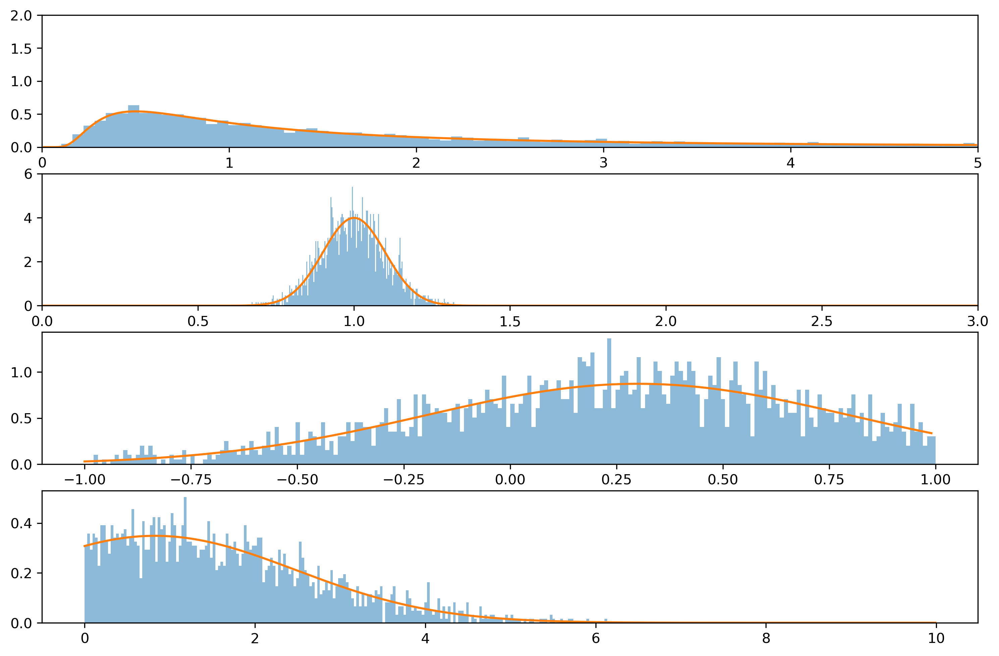

In [36]:
fig, (ax1,ax2,ax3,ax4) = plt.subplots(4,1)
# Inverse Gamma
ax1.hist(invgamma_sample(5000,1,1,ub=30),bins=500,density=True,histtype='stepfilled',alpha=0.5)
ax1.plot(np.arange(0.01,5,0.01),[invgamma_pdf(x) for x in np.arange(0.01,5,0.01)])
ax1.set_xlim(0,5)
ax1.set_ylim(0,2)
# Truncated Normal
ax2.hist(truncnormal_sample(2000,0,+np.inf,1,0.1),bins=200,density=True,histtype='stepfilled',alpha=0.5)
ax2.plot(np.arange(0,5,0.01),[truncnormal_pdf(x,0,+np.inf,1,0.1) for x in np.arange(0,5,0.01)])
ax2.set_xlim(0,3)
ax2.set_ylim(0,6)
# proposal for parameter between -1 and 1 (lambda), std of 1/4 the length of the range (2)
ax3.hist(truncnormal_sample(2000,-1,1,0.3,1/2),bins=200,density=True,histtype='stepfilled',alpha=0.5)
ax3.plot(np.arange(-1,1,0.01),[truncnormal_pdf(x,-1,1,0.3,1/2) for x in np.arange(-1,1,0.01)])
# half-normal prior for sigma_epsilon
ax4.hist(truncnormal_sample(2000,0,+np.inf,np.var(y)/2,np.var(y)),bins=200,density=True,histtype='stepfilled',alpha=0.5)
ax4.plot(np.arange(0,10,0.01),[truncnormal_pdf(x,0,+np.inf,np.var(y)/2,np.var(y)) for x in np.arange(0,10,0.01)])

<a name="42"></a>

## 4.3 Joint Prior, Likelihood, and Posterior [^](#outline)

In [37]:
# joint prior pdf
def prior_pdf(param,lb,ub,sigma_prior,*args):
    unif_priors_list = [uniform_pdf(lb,ub) for lb, ub in zip(lb[:-1],ub[:-1])]
    if sigma_prior == 'invgamma':
        if len(args)==2: alpha, beta = args
        else: alpha, beta = 1, 1
        joint_prior = np.prod(unif_priors_list)*invgamma_pdf(param[-1],alpha,beta)
    elif sigma_prior == 'truncnormal':
        if len(args)==2: mean, std = args
        else: mean, std = 0.5, 2
        joint_prior = np.prod(unif_priors_list)*truncnormal_pdf(param[-1],lb[-1],ub[-1],mean,std)
    elif sigma_prior == 'uniform':
        if len(args)==2: lb_sigma, ub_sigma = args
        else: lb_sigma, ub_sigma = 0, 5
        joint_prior = np.prod(unif_priors_list)*uniform_pdf(lb_sigma,ub_sigma)
    return joint_prior

# joint prior sample
def prior_sample(Rp,Cp,Rq,Cq,k,sigma_prior,*args):
    # returns 1 sample from the prior
    sample = ()
    # append a realisation of each model parameter
    for (N,lb,ub) in zip([Rp,Cp,Cp,Rq,Cq,Cq,k,k],[0,0,0,0,0,0,-1,0],[1,1,1/2,1,1,1/2,1,1/2]):
        sample += tuple(uniform_sample(N,lb,ub))
    # append a realisation of the innovation variance
    if sigma_prior == 'invgamma':
        if len(args)==2: alpha, beta = args
        else: alpha, beta = 1, 1
        sample += tuple(invgamma_sample(1,alpha,beta))
    elif sigma_prior == 'truncnormal':
        if len(args)==2: mean, std = args
        else: mean, std = 0.5, 2
        sample += tuple(truncnormal_sample(1,0,+np.inf,mean,std))
    elif sigma_prior == 'uniform':
        if len(args)==2: lb_sigma, ub_sigma = args
        else: lb_sigma, ub_sigma = 0, 5
        sample += tuple(uniform_sample(1,lb_sigma,ub_sigma))
    return sample

In [1477]:
# target loglikelihood taking grouped inputs
def loglik(param,data,model_spec):
  # unzip data and model specification
  f,Z = data
  Rp,Cp,Rq,Cq,k = model_spec
  # extract parameters
  param_list = extract_parameters(param,Rp,Cp,Rq,Cq,k,merged=False,display=False)
  # unzip parameters
  alpha1R = param_list[0]
  alpha1C = param_list[1]
  omega1C = param_list[2]
  alpha2R = param_list[3]
  alpha2C = param_list[4]
  omega2C = param_list[5]
  Lambda = param_list[6]
  delta = param_list[7]
  sigma_epsilon = param_list[8]
  # return Whittle loglikelihood
  # N = 2 * len(f) # length of the data
  return (W_l(f,Z, 
              alpha1R, alpha1C, omega1C, 
              alpha2R, alpha2C, omega2C,
              Lambda, delta, sigma_epsilon,
              Rp,Cp,Rq,Cq,k,
              correction=False,debiased=False))# * 1/N (does not work well – has same effect as loglik scaling)

In [39]:
# unnormalized (log) prior and posterior:
def logprior(param,lb,ub,sigma_prior,*args):
    return np.log(max(prior_pdf(param,lb,ub,sigma_prior,*args),1e-20))

def logposterior(param,lb,ub,data,model_spec,sigma_prior,*args):
    return logprior(param,lb,ub,sigma_prior,*args) + loglik(param,data,model_spec)

<a name="section-5"></a>
# 5: SMC Sampler [^](#outline)

<a name="51"></a>

## 5.1 Functions [^](#outline)

<a name="511"></a>

### 5.1.1 Particle Initialization [^](#outline)

In [40]:
def initialize_particles(N_particles,model_spec,sigma_prior,*args):
    '''
    each particle is a vector of the parameters (alpha1R,...,sigma_epsilon)
    initialize N_particles from the prior
    '''
    Rp,Cp,Rq,Cq,k = model_spec
    return [prior_sample(Rp,Cp,Rq,Cq,k,sigma_prior,*args) for _ in range(N_particles)]

<a name="512"></a>

### 5.1.2 Bridging Densities [^](#outline)

Bridging densities $\pi_t(x) \propto \pi(x) L(x|Z)^{\gamma_t}, \: t=0,\dots,N; \: \gamma_0 = 0 <\dots<\gamma_N=1$, where $N$ is the length of the schedule, $\gamma_t$ are the temperatures, $\pi(x)$ is the prior and $L(x|Z)$ is the posterior.

In [41]:
# log of bridging densities going from the prior to the posterior
# this is likelihood annealing – see Neal (2001)
def logdensity_bridge(x,lb,ub,data,model_spec,sigma_prior,
                      t,N,spacing='linear',*args):
    if spacing == 'linear':
        gamma = list(np.linspace(start=0,stop=1,num=N+1))
    elif spacing == 'geometric':
        gamma = [0]+list(np.geomspace(1/N,1,N))
    target = logprior(x,lb,ub,sigma_prior,*args) + gamma[t] * loglik(x,data,model_spec)
    # same as target = (1-gamma[j]) * logprior(x,lb,ub) + gamma[j] * logposterior(x,lb,ub)
    return target

<a name="513"></a>

### 5.1.3 MCMC Proposal [^](#outline)

Truncated normal proposal for all parameters, except $\sigma_\epsilon^2$, for which the proposal is half-normal, as this parameter has an inverse gamma rather than a uniform prior, and thus only has a lower bound of 0, but no upper bound.

In [42]:
# random walk proposals for each parameter
def proposal(lb,ub,x,delta):
    '''
    PROPOSAL FOR THE NEXT PARTICLE (EN-BLOCK)
    x is the vector of previous estimates
    lb, ub are the bounds of the parameters
    delta = (delta_params,delta_sigma) is a tuple with two elements:
        - the standard deviation of the truncated normal proposals for the model parameters, 
          espressed as a fraction (or multiple) of the parameter range
        - the standard deviation of the half-normal (truncated normal with ub=+inf) proposal
          for the innovations variance, expressed as a positive real number
    '''
    # generates one (truncated) gaussian r.v. with mean x, 
    # variance delta for each parameter
    std_list = [delta[0]*(ub-lb) for (lb, ub) in zip(lb[:-1], ub[:-1])]+[delta[1]]
    return [truncnormal_sample(1, lb, ub, mean = x, std = std)[0] for (lb,ub,x,std) in zip(lb,ub,x,std_list)]


<a name="514"></a>

### 5.1.4 ESS and Resampling [^](#outline)

In [43]:
# compute Effective Sample Size (ESS)
def compute_ESS(weights):
    sq_sum = sum([w**2 for w in weights])
    return 1.0/sq_sum

In [44]:
# resample particles – see Naesseth 2019

# weighted multinomial resampling
def multinomial_resampling(particles, weights):
    particles, weights = np.array(particles), np.array(weights) 
    u = np.random.rand(*weights.shape)
    bins = np.cumsum(weights)
    particles_new = particles[np.digitize(u,bins)]
    return list(map(tuple, particles_new))

# stratified resampling (potentially better)
def stratified_resampling(particles, weights):
    particles, weights = np.array(particles), np.array(weights) 
    N = weights.shape[0]
    u = (np.arange(N) + np.random.rand(N))/N 
    bins = np.cumsum(weights)
    return particles[np.digitize(u,bins)]

<a name="515"></a>

### 5.1.5 SMC Sampler (Master Function) [^](#outline)

#### SMC Sampler (Metropolis-Hastings)

In [45]:
#  SMC sampler

def smc_sampler(particles, lb, ub, data, model_spec, 
                sigma_prior = 'invgamma', *args, # data, prior & proposal settings
                delta = (1/4,0.1), N_bridges = 10, N_updates = 5, # sampler settings
                spacing = 'linear', resampling = True, MCMC = True, alpha=1/2, 
                loglik_scaling = False, verbose = True, print_diagnostic = False):
    '''
    particles (list of tuples): list of length N_particles with the samples 
                                (tuples of model parameters)
    lb, ub (lists): lists of length N_param with the upper and lower bounds
                    for each model parameter
    data (tuple): data = (f,Z), containing f (Fourier frequencies) and Z (periodogram values)
    model_spec (tuple): model_spec = (Rp,Cp,Rq,Cq,k), model specification
    
    delta (tuple with 2 entries): the proposal variances
            the first is entry is a fraction (of the range of each model parameter)
            the second is a positive number (for the innovation variance sigma_epsilon)
    N_bridges (int): number of bridging/intermediate densities pi_j 
                     (total N_bridges+1, ranging from prior (0) to posterior (N))
    N_updates (int): number of MCMC iterations/updates (the R_t in Li 2021)
    spacing (str): the spacing of the bridging densities ('linear' or 'geometric')
    resampling (bool): if True, resample once the ESS goes below alpha*N_particles
    MCMC (bool): if True, perform MCMC rejuvenation in the resampling step
    alpha (float in (0,1]): ESS threshold for resampling, to be multiplied by N_particles (default is 1/2)
    loglik_scaling (bool): if True, apply scaling to the logdensities in SIS and MCMC
                           for numerical stability (so that exponentiation does not give 0.0)
    verbose (bool): if True, print the status at each iteration
    '''
    # initialise the weights 
    N_particles = len(particles)
    weights = [1.0/N_particles]*N_particles
    # initialise the ESS history
    ESS_history = []
    # initialise the counter of resamplings,
    resampling_iterations = []
    # initialise the MCMC acceptance rates (list of lists)
    MCMC_accept_rates_all = []
    # initialise the array of weights (particles as columns, iterations as rows)
    weights_aray = np.ones((N_bridges+1,N_particles))
    # initialise the global start time
    start_time = time.time()

    # experimental feature – scaling factor = order of magnitude of median absolute value of loglikelihood for each particle
    if loglik_scaling == True:
        median_abs_loglik = np.median(np.abs([loglik(x,data,model_spec) for x in particles]))
        scaling_factor = 10**floor(log(median_abs_loglik,10)) #also try round instead of floor
        print('Loglikelihood scaling factor: ', scaling_factor) 
        print('Median absolute Loglikelihood for initial particles: ',round(median_abs_loglik,2),'\n')
    else: scaling_factor = 1               
    
    # SIS procedure
    for t in range(N_bridges+1):
        # record the system time at the previous iteration
        if t==0: prev_time=start_time
        else: prev_time = time.time()
        # display status – started iteration
        if verbose: print('Iteration {0} out of {1}:'.format(t+1, N_bridges+1))
        # evolve each particle with pi_t as the target
        for k in range(N_particles):
            x = particles[k]
                
            # multiply the initial weight by the prior if at the first bridging density
            if t == 0:
                L_W = logprior(x,lb,ub,sigma_prior,*args)/scaling_factor
                weights[k] = weights[k] * exp(L_W)
                
            # SIS (multiply the weights by the ratios of consecutive bridging densities)
            else:
                L_W_old = logdensity_bridge(x,lb,ub,data,model_spec,sigma_prior,
                                            t-1,N_bridges,spacing,*args)/scaling_factor # pi_t-1(x)
                L_W_new = logdensity_bridge(x,lb,ub,data,model_spec,sigma_prior,
                                            t,N_bridges,spacing,*args)/scaling_factor # pi_t(x)
                weights[k] = weights[k] * exp(L_W_new-L_W_old) # weights will be 0 and the ESS will decay fast if L_W_new-L_W_old is very negative
                # L_W_old and L_W_new can be positive, as they are based on the loglikelihood
                # one would subtract (on the log scale) the normalising constant in the denominator, but that would cancel out in L_W_new-L_W_old
                # however, L_W_new - L_W_old cannot be too large due to exponentiation – what to do?
                if print_diagnostic and k == 100: print('Scaling_factor:',scaling_factor,'Logprior:',logprior(x,lb,ub,sigma_prior,*args),'Loglik:',loglik(x,data,model_spec),'L_W_old:',L_W_old,'L_W_new:',L_W_new,'exp(L_W_new-L_W_old):',exp(L_W_new-L_W_old),'weight:',weights[k],'sigma_epsilon:',x[-1])
        # end for
        
        # renormalise weights
        w_sum = sum(weights) 
        weights = [w/w_sum for w in weights]
        # save the normalised weights
        weights_aray[t] = np.array(weights)
        # compute and save ESS
        ESS = compute_ESS(weights)
        ESS_history.append(ESS)
        if verbose: print('     ESS = {0:.2f}'.format(ESS))

        # resample and do MCMC if ESS < N/2 to prevent weight degeneracy 
        # and on on the last iteration to obtain a weighted and also less autocorrelated sample
        if resampling == True and (ESS < alpha*N_particles or t == N_bridges):
            if verbose and t==N_bridges: print('Final Resampling')
            if verbose: print('     Started Resampling')
            particles = multinomial_resampling(particles,weights)
            #particles = stratified_resampling(particles,weights)
            # reset weights 
            weights = [1.0/N_particles]*N_particles
            
            # add marker for iteration where resampling happened (for ESS plot)
            resampling_iterations.append(t+1)
                
            # MCMC step
            if MCMC == True:
                if verbose: print('     Doing MCMC')
                # initialise list of acceptance rates at each update to assess convergence
                MCMC_accept_rates = []
                for _ in range(N_updates):
                    acceptance_counter = 0
                    for k in range(N_particles):
                        x = particles[k]
                        x_new = proposal(lb,ub,x,delta)
                        # compute log acceptance (for numerical stability)
                        # use the current bridging density for the MH step
                        L_new = logdensity_bridge(x_new,lb,ub,data,model_spec,sigma_prior,
                                                  t,N_bridges,spacing,*args)/scaling_factor # pi_t(x_new)
                        L_old = logdensity_bridge(x,lb,ub,data,model_spec,sigma_prior,
                                                  t,N_bridges,spacing,*args)/scaling_factor # pi_t(x_old)
                        L_accept = L_new - L_old
                        # Accept the proposed value if min(exp(L_accept),1) > random() ~ Uniform(0,1)
                        if min(L_accept,0) > log(max(np.random.uniform(),0)):
                            particles[k] = x_new
                            acceptance_counter += 1
                    MCMC_accept_rates.append(acceptance_counter/N_particles)
                MCMC_accept_rates_all.append(MCMC_accept_rates)
            if verbose: print('     Resampled')
            
        # display status – finished iteration (display time)
        if verbose:
            print('Time spent on iteration: {0:.1f}s (Total time: {1:.1f}s) \n'.format(
                  time.time()-prev_time, time.time()-start_time))

    #loglik_list = [] # save at each iteration the average loglik accross all particles
    # or at least for the last iteration to compute the BIC if keeping track of the likelihood is too costly
    # compute the marginal likelihood of the model – see Neal (2001)
    # multiply the weights for each bridging density, then take the mean over the number of particles
    #marginal_lik = np.mean(np.prod(weights_aray,axis=0))

    # save diagnostics in a dictionary
    diagnostics = {'ESS': ESS_history,'resampling': resampling_iterations,'MCMC': MCMC_accept_rates_all,'weights':weights_aray}#,'loglik':loglik_list,'marginal_lik': marginal_lik}

    #! RESAMPLE right at the end to get weighted sample
    # and do another MCMC step to create new particles
    # this will give an exact estimate of the posterior

    # return output
    return particles, diagnostics

#### SMC Sampler Pro (Gibbs Sampler) 

In [434]:
def proposal_pro(lb,ub,x,delta,n):
    '''
    PROPOSAL FOR n-th PARAMETER WITHIN THE PARTICLE 
    (RETURNS PARTICLE WITH ONLY THAT PARAMETTER UPDATED)
    x is the vector of previous estimates
    lb, ub are the bounds of the parameters
    delta = (delta_params,delta_sigma) is a tuple with two elements:
        - the standard deviation of the truncated normal proposals for the model parameters, 
          espressed as a fraction (or multiple) of the parameter range
        - the standard deviation of the half-normal (truncated normal with ub=+inf) proposal
          for the innovations variance, expressed as a positive real number
    n = index of parameter
    '''
    # generates one (truncated) gaussian r.v. with mean x, 
    # variance delta for each parameter
    n_params = len(x) # or len(lb) or len(ub)
    max_index = n_params-1
    if n == max_index: # if the parameter is sigma_epsilon
      std = delta[1]
    else:
      std = delta[0]*(ub[n]-lb[n])
    param_new = truncnormal_sample(1, lb[n], ub[n], mean = x[n], std = std)[0]
    # convert to list to assign item, then back to tuple
    x_list = list(x)
    x_list[n] = param_new
    x = tuple(x_list)
    return x

In [437]:
def smc_sampler_pro(particles, lb, ub, data, model_spec, 
                sigma_prior = 'invgamma', *args, # data, prior & proposal settings
                delta = (1/4,0.1), N_bridges = 10, N_updates = 5, # sampler settings
                spacing = 'linear', resampling = True, MCMC = True, alpha=1/2, 
                loglik_scaling = False, verbose = True, print_diagnostic = False):
    '''
    particles (list of tuples): list of length N_particles with the samples 
                                (tuples of model parameters)
    lb, ub (lists): lists of length N_param with the upper and lower bounds
                    for each model parameter
    data (tuple): data = (f,Z), containing f (Fourier frequencies) and Z (periodogram values)
    model_spec (tuple): model_spec = (Rp,Cp,Rq,Cq,k), model specification
    
    delta (tuple with 2 entries): the proposal variances
            the first is entry is a fraction (of the range of each model parameter)
            the second is a positive number (for the innovation variance sigma_epsilon)
    N_bridges (int): number of bridging/intermediate densities pi_j 
                     (total N_bridges+1, ranging from prior (0) to posterior (N))
    N_updates (int): number of MCMC iterations/updates (the R_t in Li 2021)
    spacing (str): the spacing of the bridging densities ('linear' or 'geometric')
    resampling (bool): if True, resample once the ESS goes below alpha*N_particles
    MCMC (bool): if True, perform MCMC rejuvenation in the resampling step
    alpha (float in (0,1]): ESS threshold for resampling, to be multiplied by N_particles (default is 1/2)
    loglik_scaling (bool): if True, apply scaling to the logdensities in SIS and MCMC
                           for numerical stability (so that exponentiation does not give 0.0)
    verbose (bool): if True, print the status at each iteration
    '''
    # initialise the weights 
    N_particles = len(particles)
    N_params = len(particles[0]) # or len(ub) of len(lb)
    weights = [1.0/N_particles]*N_particles
    # initialise the ESS history
    ESS_history = []
    # initialise the counter of resamplings,
    resampling_iterations = []
    # initialise the MCMC acceptance rates (list of lists)
    MCMC_accept_rates_all = []
    # initialise the array of weights (particles as columns, iterations as rows)
    weights_aray = np.ones((N_bridges+1,N_particles))
    # initialise the global start time
    start_time = time.time()

    # experimental feature – scaling factor = order of magnitude of median absolute value of loglikelihood for each particle
    if loglik_scaling == True:
        median_abs_loglik = np.median(np.abs([loglik(x,data,model_spec) for x in particles]))
        scaling_factor = 10**floor(log(median_abs_loglik,10)) #also try round instead of floor
        print('Loglikelihood scaling factor: ', scaling_factor) 
        print('Median absolute Loglikelihood for initial particles: ',round(median_abs_loglik,2),'\n')
    else: scaling_factor = 1               
    
    # SIS procedure
    for t in range(N_bridges+1):
        # record the system time at the previous iteration
        if t==0: prev_time=start_time
        else: prev_time = time.time()
        # display status – started iteration
        if verbose: print('Iteration {0} out of {1}:'.format(t+1, N_bridges+1))
        # evolve each particle with pi_t as the target
        for k in range(N_particles):
            x = particles[k]
            # multiply the initial weight by the prior if at the first bridging density
            if t == 0:
                L_W = logprior(x,lb,ub,sigma_prior,*args)/scaling_factor
                weights[k] = weights[k] * exp(L_W)
                
            # SIS (multiply the weights by the ratios of consecutive bridging densities)
            else:
                L_W_old = logdensity_bridge(x,lb,ub,data,model_spec,sigma_prior,
                                            t-1,N_bridges,spacing,*args)/scaling_factor # pi_t-1(x)
                L_W_new = logdensity_bridge(x,lb,ub,data,model_spec,sigma_prior,
                                            t,N_bridges,spacing,*args)/scaling_factor # pi_t(x)
                weights[k] = weights[k] * exp(L_W_new-L_W_old) # weights will be 0 and the ESS will decay fast if L_W_new-L_W_old is very negative
                # L_W_old and L_W_new can be positive, as they are based on the loglikelihood
                # one would subtract (on the log scale) the normalising constant in the denominator, but that would cancel out in L_W_new-L_W_old
                # however, L_W_new - L_W_old cannot be too large due to exponentiation – what to do?
                if print_diagnostic and k == 100: print('Scaling_factor:',scaling_factor,'Logprior:',logprior(x,lb,ub,sigma_prior,*args),'Loglik:',loglik(x,data,model_spec),'L_W_old:',L_W_old,'L_W_new:',L_W_new,'exp(L_W_new-L_W_old):',exp(L_W_new-L_W_old),'weight:',weights[k],'sigma_epsilon:',x[-1])
        # end for
        
        # renormalise weights
        w_sum = sum(weights) 
        weights = [w/w_sum for w in weights]
        # save the normalised weights
        weights_aray[t] = np.array(weights)
        # compute and save ESS
        ESS = compute_ESS(weights)
        ESS_history.append(ESS)
        if verbose: print('     ESS = {0:.2f}'.format(ESS))

        # resample and do MCMC if ESS < N/2 to prevent weight degeneracy 
        # and on on the last iteration to obtain a weighted and also less autocorrelated sample
        if resampling == True and (ESS < alpha*N_particles or t == N_bridges):
            if verbose and t==N_bridges: print('Final Resampling')
            if verbose: print('     Started Resampling')
            particles = multinomial_resampling(particles,weights)
            #particles = stratified_resampling(particles,weights)
            # reset weights 
            weights = [1.0/N_particles]*N_particles
            
            # add marker for iteration where resampling happened (for ESS plot)
            resampling_iterations.append(t+1)
                
            # MCMC step
            if MCMC == True:
                if verbose: print('     Doing MCMC')
                # initialise list of acceptance rates at each update to assess convergence
                # MCMC_accept_rates = []
                for _ in range(N_updates):
                    # acceptance_counter = 0
                    for k in range(N_particles):
                        x = particles[k]
                        # perform independent Metropolis Hastings for each parameter
                        # within the particle (can be extended to using blocks instead, e.g. updating all alpha1Rs at once)
                        for n in range(N_params):
                            x_new = proposal_pro(lb,ub,x,delta,n)
                            # compute log acceptance (for numerical stability)
                            # use the current bridging density for the MH step
                            L_new = logdensity_bridge(x_new,lb,ub,data,model_spec,sigma_prior,
                                                  t,N_bridges,spacing,*args)/scaling_factor # pi_t(x_new)
                            L_old = logdensity_bridge(x,lb,ub,data,model_spec,sigma_prior,
                                                  t,N_bridges,spacing,*args)/scaling_factor # pi_t(x_old)
                            L_accept = L_new - L_old
                            # Accept the proposed value if min(exp(L_accept),1) > random() ~ Uniform(0,1)
                            if min(L_accept,0) > log(max(np.random.uniform(),0)):
                                particles[k] = x_new
                                #acceptance_counter += 1
                        
                        #MCMC_accept_rates.append(acceptance_counter/N_particles)
                #MCMC_accept_rates_all.append(MCMC_accept_rates)
            
            # end MCMC
            if verbose: print('     Resampled')
            
        # display status – finished iteration (display time)
        if verbose:
            print('Time spent on iteration: {0:.1f}s (Total time: {1:.1f}s) \n'.format(
                  time.time()-prev_time, time.time()-start_time))

    #loglik_list = [] # save at each iteration the average loglik accross all particles
    # or at least for the last iteration to compute the BIC if keeping track of the likelihood is too costly
    # compute the marginal likelihood of the model – see Neal (2001)
    # multiply the weights for each bridging density, then take the mean over the number of particles
    #marginal_lik = np.mean(np.prod(weights_aray,axis=0))

    # save diagnostics in a dictionary
    diagnostics = {'ESS': ESS_history,'resampling': resampling_iterations,'MCMC': MCMC_accept_rates_all,'weights':weights_aray}#,'loglik':loglik_list,'marginal_lik': marginal_lik}

    #! RESAMPLE right at the end to get weighted sample
    # and do another MCMC step to create new particles
    # this will give an exact estimate of the posterior

    # return output
    return particles, diagnostics

<a name="52"></a>

## 5.2 Post-Processing [^](#outline)

### Helper Functions

In [693]:
# Function to calculate the summary statistic for a data series
def sum_stat(estimate,statistic):
    '''
    statistic can be mean, median, mode
    '''
    if statistic == 'mean':
        return np.mean(estimate)
    elif statistic == 'median':
        return np.median(estimate)
    elif statistic == 'mode':
        return Counter(estimate).most_common(1)[0][0]

In [863]:
# function to find the smallest element in each row of a matrix
# without repeating the column index of each row minimum
def find_smallest(mat):
    mat = np.array(mat)
    n_row, n_col = mat.shape[0], mat.shape[1]
    smallest_vals_list = []
    assert n_row == n_col
    for i in range(n_row):
      row = mat[i]
      smallest_val_in_row = row.min()
      smallest_vals_list.append(smallest_val_in_row)
      smallest_index_in_row = np.where(row == smallest_val_in_row)
      # remove the column corresponding to this index 
      # to prevent the indices being repeated
      mat = np.delete(mat,smallest_index_in_row,axis=1)

    return smallest_vals_list

In [869]:
# Function to sort second list based on distance of elements from the first list
def bi_list_sort(list1,list2,ord_type = 'map'):
    '''
    Returns the pairs of corresponding elements in two lists 
    for which the euclidean distance is minimised
    Note: still has a bug when two distances in the matrix are precisely equal
    '''
    assert len(list1) == len(list2)
    n_elem = len(list1)
    # (n_elem x n_elem) distance matrix
    dist_mat = sp.spatial.distance.cdist([[i] for i in list1], [[i] for i in list2], metric='euclidean')
    # find smallest distance in each row
    #n_smallest = [min(dist_mat[i]) for i in range(n_elem)] #np.sort(dist_mat.flatten())[:n_elem] # return the n_elem smallest distances
    n_smallest = find_smallest(dist_mat)
    # get coordinates of n_elem smallest elements
    if ord_type == 'pairs':
        n_smallest_coord = [[np.where(dist_mat == x)[i][0] for i in (0,1)] for x in n_smallest]
    elif ord_type == 'map':
        n_smallest_coord = [[np.where(dist_mat == x)[i][0] for x in n_smallest] for i in (0,1)]
    return n_smallest_coord

<a name="521"></a>

### 5.2.1 Plots and Tables [^](#outline)

In [695]:
def loglik_plot(particles_init,particles_SMC,data,model_spec,title=True,abs=True):
    # justification for the choice of scaling factor
    # median of absolute values represents well the "average" order of magnitude of the loglikelihood
    loglik_list_init = [loglik(x,data,model_spec) for x in particles_init]
    loglik_list_SMC = [loglik(x,data,model_spec) for x in particles_SMC]
    # plot
    fig, (ax1,ax2) = plt.subplots(2,figsize=(12,8))
    if title == True: fig.suptitle('Absolute values of the loglikelihood (median in red)',fontsize=16)
    # initial particles
    if abs == True: ax1.plot(np.log10(np.abs(loglik_list_init)))
    else: ax1.plot(loglik_list_init)
    if abs == True: ax1.axhline(y=np.log10(np.median(np.abs(loglik_list_init))), color='r', linestyle='-')
    ax1.set_title('Initial Particles',fontsize=14)
    # filtered particles after SMC
    if abs == True: ax2.plot(np.log10(np.abs(loglik_list_SMC)))
    else: ax2.plot(loglik_list_SMC)
    if abs == True: ax2.axhline(y=np.log10(np.median(np.abs(loglik_list_SMC))), color='r', linestyle='-')
    ax2.set_title('Filtered Particles',fontsize=14)
    # common axis labels
    fig.supxlabel("Particle Index",fontsize=14)
    fig.supylabel("Absolute loglikelihood",fontsize=14)
    plt.tight_layout()

In [696]:
def ESS_plot(N_particles,ESS_vals,resampling_iterations,n_frequency=1,alpha=1/2,title=True):
    ESS_range = list(range(1,len(ESS_vals)+1)) # make plotting x_vals ranging over iterations
    # make tuple (low value, N_particles) where the resampling happens, used for plotting vertical lines
    resample_jump_vals=[(ESS_vals[i-1],N_particles) for i in resampling_iterations] 
    # split the ESS into segments between resamplings
    ESS_split_chunks = np.split(ESS_range,np.searchsorted(ESS_range,[x+1 for x in resampling_iterations])) # get list of lists with iterrations
    ESS_split_chunks = [list(x) for x in ESS_split_chunks] # convert numpy array elements to list
    # make the values for plotting
    plot_vals = [[ESS_vals[i-1] for i in chunk] for chunk in ESS_split_chunks]
    plot_vals_mod = [plot_vals[0]]+[[N_particles]+plot_vals[i] for i in range(1,len(plot_vals))]
    # make the range for plotting
    plot_range_mod = [ESS_split_chunks[0]]+[[iter]+ESS_split_chunks[i] for i, iter in zip(range(1,len(ESS_split_chunks)),resampling_iterations)]
    # plot the ESS segment by segment
    for (x_segment, y_segment) in zip(plot_range_mod,plot_vals_mod):
        for i in range(len(x_segment)):
            plt.plot(x_segment[i:i+2], y_segment[i:i+2], 'ko-', markersize=3)
    # plot the vertical lines where resampling happens
    plt.plot((resampling_iterations,resampling_iterations),([i for (i,j) in resample_jump_vals], [j for (i,j) in resample_jump_vals]),c='orangered',linestyle='dashed')
    # set x-axis to display every n-th iteration
    plt.gca().xaxis.set_major_locator(mticker.MultipleLocator(n_frequency))
    # plot the ESS threshold for resampling
    if alpha!=None: plt.axhline(y=alpha*N_particles, color='r', linestyle='-')
    # additional plot features
    plt.xlabel('Iteration',size=14)
    plt.ylabel('ESS',size=14)
    if title == True: plt.suptitle('Effective Sample Size (ESS) Plot',fontsize=16)

In [1554]:
def meta_plot(model_spec,param_names,param_SMC,param_init=None,param_true=None,histogram=False,kde=True,title=True,layout=None,figsize=None,type='histogram'):
    '''
    can plot histogram, boxplot, or scatterplot
    if param_init (initial particles) is specified, we plot the prior too
    New: orders the parameters in the same class to match the true parameters (as the roots are output unidentified)
    figtype = 'histogram', 'scatterplot', or 'boxplot'
    '''

    # get inputs
    Rp, Cp, Rq, Cq, k = model_spec
    N_particles = param_SMC.shape[1]
    N_bins = N_particles//50 #N_particles//10
    if param_init is not None: assert param_init.shape == param_SMC.shape
    if param_true is not None: assert len(param_true) == param_SMC.shape[0]
    
    # extract segmentation of parameters by type
    # get mean of every parameter
    param_means = [sum_stat(param,'mean') for param in param_SMC]
    param_means_list = extract_parameters(param_means,Rp,Cp,Rq,Cq,k)
    param_means_list[-1] = [param_means_list[-1]] # put sigma_epsilon square into its own list
    # make list of segmentations for parameter means and true parameters
    if param_true is not None: 
        param_true_list = extract_parameters(param_true,Rp,Cp,Rq,Cq,k)
        param_true_list[-1] = [param_true_list[-1]] # put sigma_epsilon square into its own list
        assert np.array(param_means_list,dtype='object').shape == np.array(param_true_list,dtype='object').shape
    
    n_params = param_SMC.shape[0] # Rp+2Cp+Rq+2Cq+2k+1
    n_param_classes = len(param_means_list) # 1+2+1+2+2+1 = 9
    
    # define figure specifications
    fig = plt.figure(figsize=figsize)
    color_vals = ['royalblue','gray','red','mediumblue','orange']
    alpha_vals = [0.8, 0.5, 1]
    label_vals = ['Posterior','Empirical Prior','True Value','Sample Mean']
    legend_iterable = [0]
    if param_init is not None: legend_iterable.append(1)
    if param_true is not None: legend_iterable.append(2)
    col_legends = [mpatches.Patch(color=color_vals[k], label=label_vals[k]) for k in legend_iterable]
    col_legends_boxplot = [mpatches.Patch(color=color_vals[k], label=label_vals[j]) for (k,j) in zip([4,2],[3,2])]
    if layout is None: layout = (ceil(n_params/2),2)
    if figsize is None: figsize = (12,2*n_params)

    # make figure
    i=0
    # loop over every type of parameter
    for n in range(n_param_classes):
        if param_true is not None and len(param_means_list[n])>0: 
            order_map = bi_list_sort(param_means_list[n],param_true_list[n],ord_type='map')
            param_true_reordered = [param_true_list[n][i] for i in order_map[1]]
        # loop over the number of parameters in each class
        for j in range(len(param_means_list[n])):
            i+=1
            ax = fig.add_subplot(layout[0],layout[1],i) 
            # Note: index is i-1 or n+j
            idx = i-1 # or n+j (same thing)

            # plot posterior (SMC) sample
            if type == 'histogram':
                if histogram == True: ax.hist(param_SMC[idx],bins=N_bins,density=True,color=color_vals[0],edgecolor=color_vals[0],alpha=alpha_vals[0]) 
                if kde == True: 
                    if histogram == False: sns.kdeplot(param_SMC[idx], color=color_vals[0], bw_method=0.25, clip =(min(param_SMC[idx]), max(param_SMC[idx])),shade=True)
                    elif histogram == True: sns.kdeplot(param_SMC[idx], color=color_vals[3], bw_method=0.25, clip =(min(param_SMC[idx]), max(param_SMC[idx])),shade=False)
            elif type == 'scatterplot':
                ax.scatter(np.arange(1,N_particles+1,1), param_SMC[idx], color=color_vals[0], marker='o', alpha=alpha_vals[0])
            elif type == 'boxplot':
                plt.boxplot([param_SMC[idx]])
                plt.xticks([1], ['Filtered Particles'],size=12)

            # plot the prior sample (optional)
            if param_init is not None:
                if type == 'histogram':
                    if histogram == True: ax.hist(param_init[idx],bins=N_bins,density=True,color=color_vals[1],edgecolor=color_vals[1],alpha=alpha_vals[1])
                    if kde == True: sns.kdeplot(param_init[idx], color=color_vals[1], bw_method=0.25, clip =(min(param_init[idx]), max(param_init[idx])),shade=True)
                elif type == 'scatterplot':
                    ax.scatter(np.arange(1,N_particles+1,1), param_init[idx], color=color_vals[1], marker='o', alpha=alpha_vals[1])
                elif type == 'boxplot':
                    plt.boxplot([param_SMC[idx],param_init[idx]])
                    plt.xticks([1, 2], ['Filtered Particles', 'Initial Particles'],size=12)
            
            # plot the true parameters (optional)
            if param_true is not None:
                if type == 'histogram':
                    plt.axvline(x=param_true_reordered[j], color=color_vals[2], linestyle='--', alpha=alpha_vals[2])
                elif type == 'scatterplot':
                    plt.axhline(y=param_true_reordered[j], color=color_vals[2], linestyle='--', alpha=alpha_vals[2])
                elif type == 'boxplot':
                    plt.axhline(y=param_true_reordered[j], color=color_vals[2], linestyle='--',alpha=0.8,linewidth=0.8)
            
            # legend, subplot titles and axis labels
            if type == 'histogram' or type == 'scatterplot':
                if param_init is not None or param_true is not None:
                    plt.legend(handles = col_legends, prop={'size': 8})
            if type == 'boxplot':
                if param_true is not None:
                    plt.legend(handles = col_legends_boxplot)
            plt.title(param_names[idx],size=14)
            if type == 'histogram':
                plt.xlabel('Value',size=12)
                plt.ylabel('Frequency',size=12)
            elif type == 'scatterplot':
                plt.xlabel('Particle',size=12)
                plt.ylabel('Value',size=12)
            elif type == 'boxplot':
                plt.ylabel('Value',size=12)
    
    if title == True:
        if type == 'histogram': plt.suptitle('Parameter Distributions',size=16)
        elif type == 'scatterplot': plt.suptitle('Particles Evolution',size=16)
        elif type == 'boxplot': plt.suptitle('Parameter Box-Plot',size=16)
        
    plt.tight_layout()

In [698]:
# summary statistics
def summary_table(param_names,param_SMC,param_true=None,print=False,save=False,save_name='table'):
    summary_df = pd.DataFrame({'Parameter':param_names,
    'Minimum':list(np.min(param_SMC,axis=1)),
    'Maximum':list(np.max(param_SMC,axis=1)),
    'Mean':list(np.mean(param_SMC,axis=1)),
    'Median':list(np.median(param_SMC,axis=1)),
    'Mode':[Counter(estimate).most_common(1)[0][0] for estimate in param_SMC]})
    
    if param_true is not None:
        # extract segmentation of parameters by type
        # get mean of every parameter
        param_means = [sum_stat(param,'mean') for param in param_SMC]
        param_means_list = extract_parameters(param_means,Rp,Cp,Rq,Cq,k)
        param_means_list[-1] = [param_means_list[-1]] # put sigma_epsilon square into its own list
        # make list of segmentations for parameter means and true parameters
    
        param_true_list = extract_parameters(param_true,Rp,Cp,Rq,Cq,k)
        param_true_list[-1] = [param_true_list[-1]] # put sigma_epsilon square into its own list
        assert np.array(param_means_list,dtype='object').shape == np.array(param_true_list,dtype='object').shape
        param_true_reordered_list = param_true_list.copy()

        n_params = param_SMC.shape[0] # Rp+2Cp+Rq+2Cq+2k+1
        n_param_classes = len(param_means_list) # 1+2+1+2+2+1 = 9
        for n in range(n_param_classes):
            if param_true is not None and len(param_means_list[n])>0: 
                order_map = bi_list_sort(param_means_list[n],param_true_list[n],ord_type='map')
                param_true_reordered_list[n] = [param_true_list[n][i] for i in order_map[1]]
        
        param_true_reordered = list(itertools.chain.from_iterable(param_true_reordered_list))
        summary_df['True Value'] = param_true_reordered

    ###############################################################################
    summary_df.index = pd.RangeIndex(start=1, stop=len(param_names)+1, step=1)
    summary_df = summary_df.round(3)

    if print == True: display(Markdown(summary_df.to_markdown()))
    if save == True:
        summary_df = summary_df.style.format(decimal='.', thousands=',', precision=3)
        with open(save_name+'.tex', 'w') as tf:
            tf.write(summary_df.to_latex())

<a name="522"></a>

### 5.2.2 Post-Processing Pipeline [^](#outline)

In [1484]:
def post_process_smc(particles_init,particles_SMC,diagnostics_SMC,data,model_spec,
                    plot_init = True, param_true = None, S_true = None, stat = 'mean',
                    ESS = True, histogram = True, scatter = True, boxplot = True, table = True,  
                    SDF = True, BIC = True, L2 = True, plot_settings = None, 
                    save = False, display = True, plot_titles=False):
    
    # 1. Read in data and model specification
    f, Z  = data
    Rp, Cp, Rq, Cq, k = model_spec
    ESS_vals = diagnostics_SMC['ESS']
    resampling_iterations = diagnostics_SMC['resampling']
    
    # Make arrays of particles and
    param_init = np.array(particles_init) # initial particles
    param_init = np.transpose(param_init)
    param_SMC = np.array(particles_SMC) # particles following SMC
    param_SMC = np.transpose(param_SMC)
    N_particles = param_SMC.shape[1] # == len(particles_SMC)
    n_params = param_SMC.shape[0] # == Rp+2*Cp+Rq+2*Cq+k
    
    # 2. Create directory and save files there
    
    model_name = 'GARMA_'+''.join(map(str, model_spec))
    now = datetime.datetime.now() # current date and time
    date_time = now.strftime("%m.%d.%Y_%Hh%Mm")

    script_dir = os.path.dirname(os.getcwd())
    results_dir = os.path.join(script_dir, model_name+'/')
    if save == True:
      if not os.path.isdir(results_dir):
        os.makedirs(results_dir)

    # 3. Save particles and diagnostics to folder

    # particles
    if save == True:
      with open(results_dir+model_name+'_particles_init_'+date_time+'.txt', "w") as file:   
        for t in particles_init:
          file.write(','.join(str(s) for s in t) + '\n')
      with open(results_dir+model_name+'_particles_SMC_'+date_time+'.txt', "w") as file:   
        for t in particles_SMC:
          file.write(','.join(str(s) for s in t) + '\n')
    # to decode:
    # with open('particles_SMC.txt') as txt_file:
    #   particles_SMC_good_run = [tuple(map(float, i.split(','))) for i in txt_file]

    # diagnostics excluding weights
    if save == True:
      with open(results_dir+model_name+'_diagnostics_SMC_'+date_time+'.json', 'w') as file:
        json.dump({key: diagnostics_SMC[key] for key in ('ESS', 'resampling', 'MCMC')}, file)
    # to decode:
    # with open('diagnostics_SMC.json') as json_file:
    #   data = json.load(json_file)

    # 4. Extract the lists with each set of parameters and create the labels/names
    
    param_SMC_list = extract_parameters(param_SMC,Rp,Cp,Rq,Cq,k,merged=False,display=False)
    # AR
    alpha1R_SMC = param_SMC_list[0]
    alpha1R_names = [r'$\alpha_{{1{}}}^R$ (AR Real {})'.format(i+1,i+1) for i in range(len(alpha1R_SMC))]
    alpha1C_SMC = param_SMC_list[1]
    alpha1C_names = [r'$\alpha_{{1{}}}^C$ (AR Complex Modulus {})'.format(i+1,i+1) for i in range(len(alpha1C_SMC))]
    omega1C_SMC = param_SMC_list[2]
    omega1C_names = [r'$\omega_{{1{}}}^C$ (AR Complex Argument {})'.format(i+1,i+1) for i in range(len(omega1C_SMC))]
    # MA
    alpha2R_SMC = param_SMC_list[3]
    alpha2R_names = [r'$\alpha_{{2{}}}^R$ (MA Real {})'.format(i+1,i+1) for i in range(len(alpha2R_SMC))]
    alpha2C_SMC = param_SMC_list[4]
    alpha2C_names = [r'$\alpha_{{2{}}}^C$ (MA Complex Modulus {})'.format(i+1,i+1) for i in range(len(alpha2C_SMC))]
    omega2C_SMC = param_SMC_list[5]
    omega2C_names = [r'$\omega_{{2{}}}^C$ (MA Complex Argument {})'.format(i+1,i+1) for i in range(len(omega2C_SMC))]
    # Gegenbauer
    lambda_SMC = param_SMC_list[6]
    lambda_names = [r'$\lambda_{}$ (Gegenbauer {})'.format(i+1,i+1) for i in range(len(lambda_SMC))]
    delta_SMC = param_SMC_list[7]
    delta_names = [r'$\delta_{}$ (Gegenbauer memory {})'.format(i+1,i+1) for i in range(len(delta_SMC))]
    # Variance
    sigma_epsilon_SMC = param_SMC_list[8]
    sigma_epsilon_name = [r'$\sigma_\epsilon^2$ (Innovation Variance)']

    # make common list for all parameters
    param_names = (alpha1R_names+alpha1C_names+omega1C_names+
               alpha2R_names+alpha2C_names+omega2C_names+
               lambda_names+delta_names+sigma_epsilon_name)
    
    # 5. Extract the point estimates for the SDF plot using the summary statistic

    alpha1R_est = [sum_stat(alpha1R,stat) for alpha1R in alpha1R_SMC]
    alpha1C_est = [sum_stat(alpha1C,stat) for alpha1C in alpha1C_SMC]
    alpha1_est = alpha1R_est + alpha1C_est

    omega1R_est = [0]*Rp
    omega1C_est = [sum_stat(omega1C,stat) for omega1C in omega1C_SMC]
    omega1_est = omega1R_est + omega1C_est

    alpha2R_est = [sum_stat(alpha2R,stat) for alpha2R in alpha2R_SMC]
    alpha2C_est = [sum_stat(alpha2C,stat) for alpha2C in alpha2C_SMC]
    alpha2_est = alpha2R_est + alpha2C_est

    omega2R_est = [0]*Rq
    omega2C_est = [sum_stat(omega2C,stat) for omega2C in omega2C_SMC]
    omega2_est = omega2R_est + omega2C_est

    lambda_est = [sum_stat(Lambda,stat) for Lambda in lambda_SMC]
    delta_est = [sum_stat(delta,stat) for delta in delta_SMC]
    sigma_epsilon_est = sum_stat(sigma_epsilon_SMC,stat) # 1

    #param_est=alpha1_est+omega1_est+alpha2_est+omega2_est+lambda_est+delta_est+[sigma_epsilon_est]
    param_est = alpha1R_est+alpha1C_est+omega1C_est+alpha2R_est+alpha2C_est+omega2C_est+lambda_est+delta_est+[sigma_epsilon_est]

    # 6. Model fit – Maximum Likelihood and BIC
    if BIC == True:
      max_loglik = loglik(param_est,data,model_spec)
      print('Maximized Loglikelihood: ',max_loglik)
      bic = n_params*np.log(N_particles) - 2 * max_loglik
      print('BIC: ',bic)

      if param_true is not None: 
        true_max_loglik = loglik(param_true,data,model_spec)
        print('True Maximum Loglikelihood: ',true_max_loglik)
        best_bic = n_params*np.log(N_particles) - 2 * true_max_loglik
        print('Best Achievable BIC: ',best_bic)

      # save:
      if param_true is not None:
        summary_dict = {
        'param_est': param_est,
        'max_loglik': max_loglik,
        'bic': bic,
        'true_max_loglik': true_max_loglik,
        'best_bic': best_bic,
        'param_true': param_true }
      else:
        summary_dict = {
        'param_est': param_est,
        'max_loglik': max_loglik,
        'bic': bic}

      if save == True:
        with open(results_dir+model_name+'_summary_bic_loglik_'+date_time+'.txt', 'w') as file:
          w = csv.writer(file)
          w.writerows(summary_dict.items())
    
    
    # 7. Plots
    # optional features for plots
    if plot_settings is not None:
      plot_features = plot_settings
    else:
      plot_features = {'ESS':{'n_frequency': 1, 'alpha': 0.5},
                'metaplot': {'histogram': False, 'kde': True, 'layout': (5,2), 'figsize': (12,20)},
                'SDF':{'with_peaks':True, 'with_periodogram': True, 'log_scale': True,'align_scale': False,'periodogram_display': 'line','high_res': True},
                'variance':{'multiply': False, 'divide': False, 'times_variance': False}}
    
    if ESS == True:
      ESS_plot(N_particles,ESS_vals,resampling_iterations,
              n_frequency=plot_features['ESS']['n_frequency'],alpha=plot_features['ESS']['alpha'],title=plot_titles)
      if save == True: plt.savefig(results_dir + (model_name+'_ESS_plot_'+date_time+'.png'))
      if display == True: plt.show()
    
    if plot_init == False:
      param_init = None # otherwise it stays as in step 1

    if histogram == True:
      meta_plot(model_spec,param_names,param_SMC,param_init,param_true,
      histogram=plot_features['metaplot']['histogram'],kde=plot_features['metaplot']['kde'],title=plot_titles,
      layout=plot_features['metaplot']['layout'],figsize=plot_features['metaplot']['figsize'],
      type='histogram')
      if save == True: plt.savefig(results_dir + (model_name+'_hist_plot_'+date_time+'.png'))
      if display == True: plt.show()

    if scatter == True:
      meta_plot(model_spec,param_names,param_SMC,param_init,param_true,
      histogram=plot_features['metaplot']['histogram'],kde=plot_features['metaplot']['kde'],title=plot_titles,
      layout=plot_features['metaplot']['layout'],figsize=plot_features['metaplot']['figsize'],
      type='scatterplot')
      if save == True: plt.savefig(results_dir + (model_name+'_scatter_plot_'+date_time+'.png'))
      if display == True: plt.show()

    if boxplot == True:
      meta_plot(model_spec,param_names,param_SMC,param_init,param_true,
      histogram=plot_features['metaplot']['histogram'],kde=plot_features['metaplot']['kde'],title=plot_titles,
      layout=plot_features['metaplot']['layout'],figsize=plot_features['metaplot']['figsize'],
      type='boxplot')
      if save == True: plt.savefig(results_dir + (model_name+'_box_plot_'+date_time+'.png'))
      if display == True: plt.show()

    if table == True:
      summary_table(param_names,param_SMC,param_true,print=display,save=save,save_name=results_dir+(model_name+'_table_'+date_time))
    
    if SDF == True:
        # option to plot estimated SDF and true spectrum on high-res frequency grid to see poles
        if plot_features['SDF']['high_res'] == True: f_SDF = np.linspace(min(f),max(f),100001)
        else: f_SDF = f
        S_Y_est = S_Y_vec(f_SDF,alpha1_est,omega1_est,alpha2_est,omega2_est,
                          lambda_est,delta_est,sigma_epsilon_est,p,q,k)
        # option to also plot the periodogram
        if plot_features['SDF']['with_periodogram'] == True: periodogram_vals = Z
        else: periodogram_vals = None
        
        # scaling if sigma_epsilon not estimated
        if plot_features['variance']['multiply'] == True:
          S_Y_est = sigma_epsilon_est*S_Y_est
        if plot_features['variance']['divide'] == True:
          S_Y_est = 1/sigma_epsilon_est*S_Y_est
        if plot_features['variance']['times_variance'] == True:
          S_Y_est = np.var(y)*S_Y_est
        
        # L2-norm of difference between the estimated and true SDF
        if L2 == True and S_true is not None and len(S_true)==len(S_Y_est): 
          print('L2 norm of Spectral Error: ',sum((S_Y_est-S_true)**2))
        
        # PLOT the SDF (plus optionally the periodogram and true spectrum, if available)
        plot_SDF(f,S_Y_est,periodogram_vals=periodogram_vals,true_vals=S_true,with_peaks=plot_features['SDF']['with_peaks'],
        Lambda=lambda_est,alpha1C=alpha1C_est,omega1C=omega1C_est,
        log=plot_features['SDF']['log_scale'],title='',align_scale=plot_features['SDF']['align_scale'],periodogram_display=plot_features['SDF']['periodogram_display'])
        if save == True: plt.savefig(results_dir + (model_name+'_SDF_plot_'+date_time+'.png'))
        if display == True: plt.show()


In [ ]:
# saving and opening json files
# with open('diagnostics_SMC.json', 'w') as fp:
#     json.dump({k: diagnostics_SMC[k] for k in ('ESS', 'resampling', 'MCMC', 'loglik', 'marginal_lik')}, fp)
# with open('diagnostics_SMC.json') as json_file:
#     data = json.load(json_file)

<a name="53"></a>

## 5.3 Input and Output (Running the Sampler) [^](#outline)

<a name="531"></a>

### 5.3.1 Data and Model Selection (Input) [^](#outline)

In [1496]:
# Choose the Data
f, Z = S_p_vec(y,tapered=True,taper='hann')
data = (f,Z)

######################################################################

# Model Selection
Rp=1 # number of real AR roots
Cp=0 # number of complex AR roots
# MA(q) model specification
Rq=1 # number of real MA roots
Cq=1 # number of complex MA roots
# Gegenbauer(k) model specification
k=2 # number of Gegenbauer factors

######################################################################

# Define the vector of model specifications
model_spec = (Rp,Cp,Rq,Cq,k)

# Set the lower and upper bounds for the given model
lb_param, ub_param = set_bounds(Rp,Cp,Rq,Cq,k)

# Calculate the number of parameters to estimate
p=Rp+2*Cp
q=Rq+2*Cq
nparam = Rp+2*Cp+Rq+2*Cq+2*k+1
print("Model specified: GARMA (",p,",",k,",",q,")", "\n")
print("Number of parameters to estimate: ",nparam, "\n")


Model specified: GARMA ( 1 , 2 , 3 ) 

Number of parameters to estimate:  9 



<a name="532"></a>

### 5.3.2 Prior Specification and Particle Initialization [^](#outline)

In [1497]:
# Specify the prior on sigma_epsilon
sigma_prior, sigma_shape, sigma_scale = 'invgamma', 1, 1
#sigma_prior, sigma_mean, sigma_std = 'truncnormal', np.var(y)/2, np.var(y)
#sigma_prior, sigma_mean, sigma_std = 'truncnormal', 1, 0.001
#sigma_prior, sigma_lb, sigma_ub = 'uniform', 0, 5

######################################################################

# Initialize the particles
N_particles = 1000
particles_init = initialize_particles(N_particles,model_spec,sigma_prior, sigma_shape, sigma_scale)
# inspect particles
particles_init[:5]

[(0.023470313739167525,
  0.7151501224099388,
  0.3503900062099622,
  0.2630152268924289,
  0.44319004531117323,
  0.19335361129726625,
  0.0013413908740459446,
  0.4864536857634609,
  1.4585512976400536),
 (0.3339413157900063,
  0.9245386392778936,
  0.8835718134326798,
  0.4172327016945956,
  0.9924092332844319,
  0.06651224380383569,
  0.25595149685803553,
  0.03426455910828452,
  0.8801648873642917),
 (0.3181539504143551,
  0.8312770997877519,
  0.20285533658629062,
  0.0962201906358312,
  0.4422108783876719,
  -0.07908079047706607,
  0.43851835736477274,
  0.10459367561079258,
  2.35454023448103),
 (0.5735822802736481,
  0.6318292907071795,
  0.6740259368605029,
  0.17824546993233575,
  0.7854221258226326,
  -0.14729674879942145,
  0.4922969753227438,
  0.21355444265307705,
  0.31567964154947814),
 (0.47230546727416556,
  0.6024992162542213,
  0.9923649301466576,
  0.4796333128866875,
  -0.4031872431723218,
  0.3389369332972796,
  0.18569392844046118,
  0.3009691727773325,
  1.305

<a name="533"></a>

### 5.3.3 Running the SMC Sampler (Output) [^](#outline)

#### Settings and Hyperparameters

In [1498]:
# proposal variance (fraction of parameter range, absolute value for variance)
proposal_variance = (0.4,1) #(0.4,1) #(1/4, 0.5) #(1/2, 1)
# number of bridges and MCMC updates for each bridging distribution
N_iterations = 100 #20 #50 #60 
N_MCMC_updates = 5 #2 #25 #30
# ESS resampling threshold (fraction between 0 and 1 of number of particles)
threshold = 0.5 #0.7
# AIS bridging densities spacing type
spacing_type = 'linear' #'geometric'

#### SMC Run

In [1359]:
particles_SMC_cpi_garma_00002_tapered, diagnostics_SMC_cpi_garma_00002_tapered = smc_sampler_pro(particles_init, lb_param, ub_param, 
                                            data, model_spec,
                                            sigma_prior, sigma_shape, sigma_scale,
                                            delta = proposal_variance, N_bridges = N_iterations, N_updates = N_MCMC_updates, 
                                            spacing = spacing_type, resampling = True, MCMC = True, alpha=threshold, 
                                            loglik_scaling = False, verbose = True, print_diagnostic = True)

Iteration 1 out of 101:
     ESS = 634.14
Time spent on iteration: 0.1s (Total time: 0.1s) 

Iteration 2 out of 101:
Scaling_factor: 1 Logprior: -4.1498345548030695 Loglik: -615.3009507280478 L_W_old: -4.1498345548030695 L_W_new: -10.302844062083548 exp(L_W_new-L_W_old): 0.002127070693048282 weight: 1.3372881241803665e-07 sigma_epsilon: 7.446719642533509
     ESS = 314.09
     Started Resampling
     Doing MCMC
     Resampled
Time spent on iteration: 487.3s (Total time: 487.4s) 

Iteration 3 out of 101:
Scaling_factor: 1 Logprior: -0.8380853097483179 Loglik: -522.6758658048842 L_W_old: -6.06484396779716 L_W_new: -11.291602625846002 exp(L_W_new-L_W_old): 0.005370906062085056 weight: 5.3709060620850555e-06 sigma_epsilon: 0.8361730436741748
     ESS = 832.55
Time spent on iteration: 20.6s (Total time: 507.9s) 

Iteration 4 out of 101:
Scaling_factor: 1 Logprior: -0.8380853097483179 Loglik: -522.6758658048842 L_W_old: -11.291602625846002 L_W_new: -16.518361283894844 exp(L_W_new-L_W_old): 0

In [1430]:
particles_SMC_cpi_garma_00003_tapered, diagnostics_SMC_cpi_garma_00003_tapered = smc_sampler_pro(particles_init, lb_param, ub_param, 
                                            data, model_spec,
                                            sigma_prior, sigma_shape, sigma_scale,
                                            delta = proposal_variance, N_bridges = N_iterations, N_updates = N_MCMC_updates, 
                                            spacing = spacing_type, resampling = True, MCMC = True, alpha=threshold, 
                                            loglik_scaling = False, verbose = True, print_diagnostic = True)

Iteration 1 out of 101:
     ESS = 651.40
Time spent on iteration: 0.1s (Total time: 0.1s) 

Iteration 2 out of 101:
Scaling_factor: 1 Logprior: -1.4030715055031635 Loglik: -3575.5650668301655 L_W_old: -1.4030715055031635 L_W_new: -37.15872217380482 exp(L_W_new-L_W_old): 2.961544194403907e-16 weight: 2.86470374081875e-19 sigma_epsilon: 0.23053100240934318
     ESS = 280.59
     Started Resampling
     Doing MCMC
     Resampled
Time spent on iteration: 706.9s (Total time: 706.9s) 

Iteration 3 out of 101:
Scaling_factor: 1 Logprior: -1.8256184576602341 Loglik: -393.862312977174 L_W_old: -5.7642415874319735 L_W_new: -9.702864717203713 exp(L_W_new-L_W_old): 0.0194750108564116 weight: 1.94750108564116e-05 sigma_epsilon: 1.9201749173751685
     ESS = 819.48
Time spent on iteration: 19.8s (Total time: 726.7s) 

Iteration 4 out of 101:
Scaling_factor: 1 Logprior: -1.8256184576602341 Loglik: -393.862312977174 L_W_old: -9.702864717203713 L_W_new: -13.641487846975453 exp(L_W_new-L_W_old): 0.0194

In [1455]:
particles_SMC_cpi_garma_02000_tapered, diagnostics_SMC_cpi_garma_02000_tapered = smc_sampler_pro(particles_init, lb_param, ub_param, 
                                            data, model_spec,
                                            sigma_prior, sigma_shape, sigma_scale,
                                            delta = proposal_variance, N_bridges = N_iterations, N_updates = N_MCMC_updates, 
                                            spacing = spacing_type, resampling = True, MCMC = True, alpha=threshold, 
                                            loglik_scaling = False, verbose = True, print_diagnostic = True)

Iteration 1 out of 101:
     ESS = 662.53
Time spent on iteration: 0.0s (Total time: 0.0s) 

Iteration 2 out of 101:
Scaling_factor: 1 Logprior: -1.0260968635681478 Loglik: -1598.1775725260945 L_W_old: -1.0260968635681478 L_W_new: -17.007872588829095 exp(L_W_new-L_W_old): 1.1460484853115659e-07 weight: 3.9231847510194116e-11 sigma_epsilon: 2.793205316113943
     ESS = 140.58
     Started Resampling
     Doing MCMC
     Resampled
Time spent on iteration: 809.1s (Total time: 809.1s) 

Iteration 3 out of 101:
Scaling_factor: 1 Logprior: -1.2051039735304603 Loglik: -405.71627247496906 L_W_old: -5.2622666982801505 L_W_new: -9.319429423029842 exp(L_W_new-L_W_old): 0.01729802882451389 weight: 1.729802882451389e-05 sigma_epsilon: 3.1111294555386375
     ESS = 777.02
Time spent on iteration: 30.1s (Total time: 839.3s) 

Iteration 4 out of 101:
Scaling_factor: 1 Logprior: -1.2051039735304603 Loglik: -405.71627247496906 L_W_old: -9.319429423029842 L_W_new: -13.376592147779533 exp(L_W_new-L_W_old)

In [1470]:
particles_SMC_cpi_garma_12110_tapered, diagnostics_SMC_cpi_garma_12110_tapered = smc_sampler_pro(particles_init, lb_param, ub_param, 
                                            data, model_spec,
                                            sigma_prior, sigma_shape, sigma_scale,
                                            delta = proposal_variance, N_bridges = N_iterations, N_updates = N_MCMC_updates, 
                                            spacing = spacing_type, resampling = True, MCMC = True, alpha=threshold, 
                                            loglik_scaling = False, verbose = True, print_diagnostic = True)

Iteration 1 out of 101:
     ESS = 659.42
Time spent on iteration: 0.0s (Total time: 0.0s) 

Iteration 2 out of 101:
Scaling_factor: 1 Logprior: 0.09095053211765286 Loglik: -895.975761983837 L_W_old: 0.09095053211765286 L_W_new: -8.868807087720716 exp(L_W_new-L_W_old): 0.00012847739033142324 weight: 6.772580293352535e-08 sigma_epsilon: 2.1394270893207885
     ESS = 93.57
     Started Resampling
     Doing MCMC
     Resampled
Time spent on iteration: 2140.0s (Total time: 2140.0s) 

Iteration 3 out of 101:
Scaling_factor: 1 Logprior: 0.6610032544533724 Loglik: -407.93941110751564 L_W_old: -3.4183908566217847 L_W_new: -7.4977849676969415 exp(L_W_new-L_W_old): 0.016917712802895345 weight: 1.6917712802895346e-05 sigma_epsilon: 1.434168138253749
     ESS = 785.64
Time spent on iteration: 45.0s (Total time: 2185.0s) 

Iteration 4 out of 101:
Scaling_factor: 1 Logprior: 0.6610032544533724 Loglik: -407.93941110751564 L_W_old: -7.4977849676969415 L_W_new: -11.577179078772096 exp(L_W_new-L_W_old)

In [1499]:
particles_SMC_cpi_garma_10112_tapered, diagnostics_SMC_cpi_garma_10112_tapered = smc_sampler_pro(particles_init, lb_param, ub_param, 
                                            data, model_spec,
                                            sigma_prior, sigma_shape, sigma_scale,
                                            delta = proposal_variance, N_bridges = N_iterations, N_updates = N_MCMC_updates, 
                                            spacing = spacing_type, resampling = True, MCMC = True, alpha=threshold, 
                                            loglik_scaling = False, verbose = True, print_diagnostic = True)

Iteration 1 out of 101:
     ESS = 654.93
Time spent on iteration: 0.0s (Total time: 0.0s) 

Iteration 2 out of 101:
Scaling_factor: 1 Logprior: -0.23657534262698515 Loglik: -2706.0857309163416 L_W_old: -0.23657534262698515 L_W_new: -27.297432651790402 exp(L_W_new-L_W_old): 1.768556729264265e-12 weight: 2.6700951651315858e-15 sigma_epsilon: 0.9295927700675453
     ESS = 146.92
     Started Resampling
     Doing MCMC
     Resampled
Time spent on iteration: 1879.9s (Total time: 1879.9s) 

Iteration 3 out of 101:
Scaling_factor: 1 Logprior: -0.5519301157810182 Loglik: -464.1029459085848 L_W_old: -5.192959574866866 L_W_new: -9.833989033952715 exp(L_W_new-L_W_old): 0.009647760538757488 weight: 9.647760538757488e-06 sigma_epsilon: 1.2487399966557837
     ESS = 796.73
Time spent on iteration: 41.0s (Total time: 1920.9s) 

Iteration 4 out of 101:
Scaling_factor: 1 Logprior: -0.5519301157810182 Loglik: -464.1029459085848 L_W_old: -9.833989033952715 L_W_new: -14.475018493038561 exp(L_W_new-L_W_o

Note: for the `sms_sampler_pro` function, we need a very small number of `N_MCMC_updates`, as there are `N_params` times more MCMC steps than in the en-bloc updating sampler. So, for instance, 3 MCMC steps when there are 10 parameters are equivalent to 30 MCMC steps in the older version.

<a name="534"></a>

### 5.3.4 Post-Processing (Plots and Diagnostics) [^](#outline)

In [1504]:
plot_features = {'ESS':{'n_frequency': 10, 'alpha': 0.5},
                'metaplot': {'histogram': False, 'kde': True, 'layout': (5,2), 'figsize': (12,20)},
                'SDF':{'with_peaks': True, 'with_periodogram': True, 'log_scale': True,'align_scale': False,'periodogram_display': 'line','high_res': True},
                'variance':{'multiply': False, 'divide': False, 'times_variance': False}}

Maximized Loglikelihood:  -343.6454522955665
BIC:  749.4607021019722


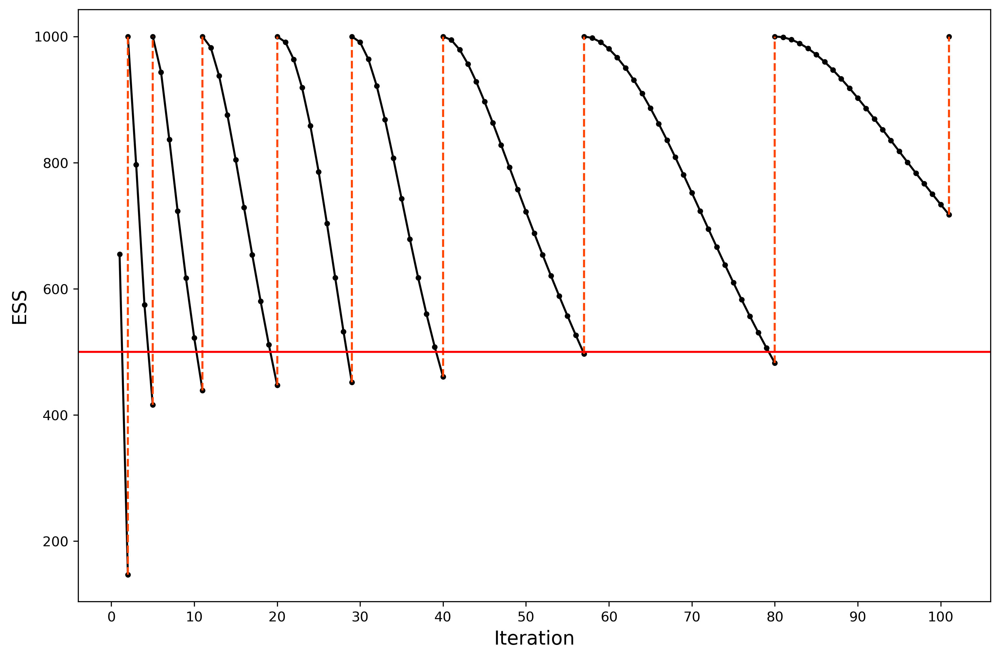

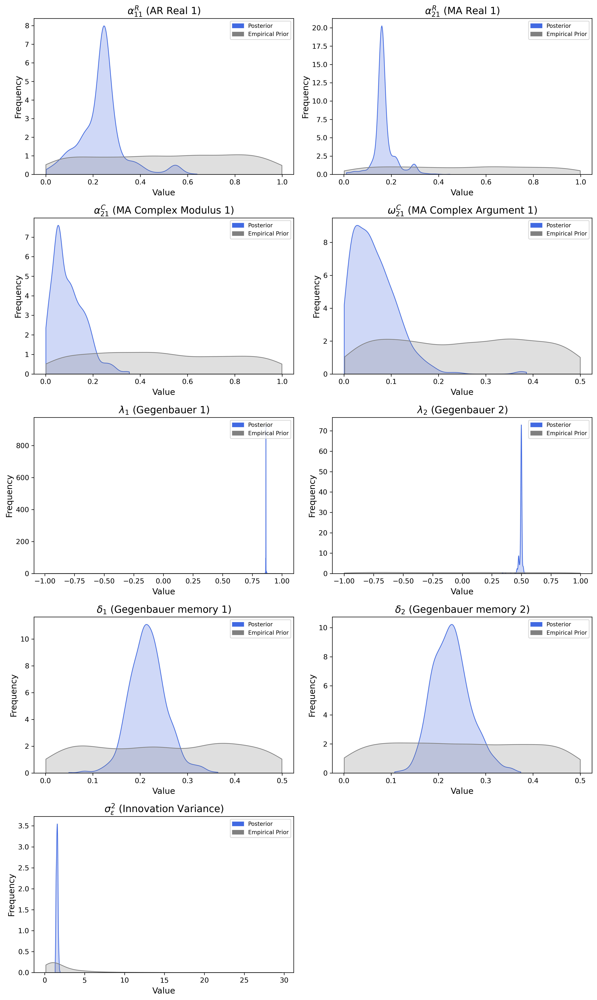

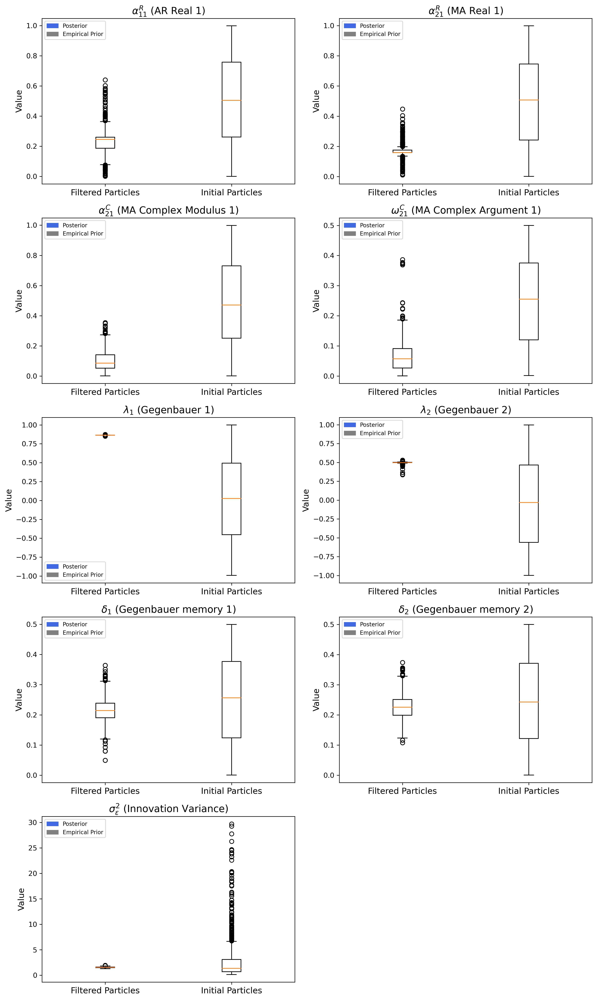

|    | Parameter                                 |   Minimum |   Maximum |   Mean |   Median |   Mode |
|---:|:------------------------------------------|----------:|----------:|-------:|---------:|-------:|
|  1 | $\alpha_{11}^R$ (AR Real 1)               |     0.002 |     0.64  |  0.238 |    0.245 |  0.245 |
|  2 | $\alpha_{21}^R$ (MA Real 1)               |     0.011 |     0.447 |  0.171 |    0.159 |  0.159 |
|  3 | $\alpha_{21}^C$ (MA Complex Modulus 1)    |     0.001 |     0.354 |  0.098 |    0.085 |  0.053 |
|  4 | $\omega_{21}^C$ (MA Complex Argument 1)   |     0     |     0.386 |  0.065 |    0.057 |  0.021 |
|  5 | $\lambda_1$ (Gegenbauer 1)                |     0.851 |     0.874 |  0.865 |    0.864 |  0.864 |
|  6 | $\lambda_2$ (Gegenbauer 2)                |     0.337 |     0.531 |  0.495 |    0.497 |  0.497 |
|  7 | $\delta_1$ (Gegenbauer memory 1)          |     0.049 |     0.364 |  0.216 |    0.214 |  0.207 |
|  8 | $\delta_2$ (Gegenbauer memory 2)          |     0.107 |     0.374 |  0.228 |    0.225 |  0.207 |
|  9 | $\sigma_\epsilon^2$ (Innovation Variance) |     1.297 |     1.927 |  1.544 |    1.546 |  1.413 |

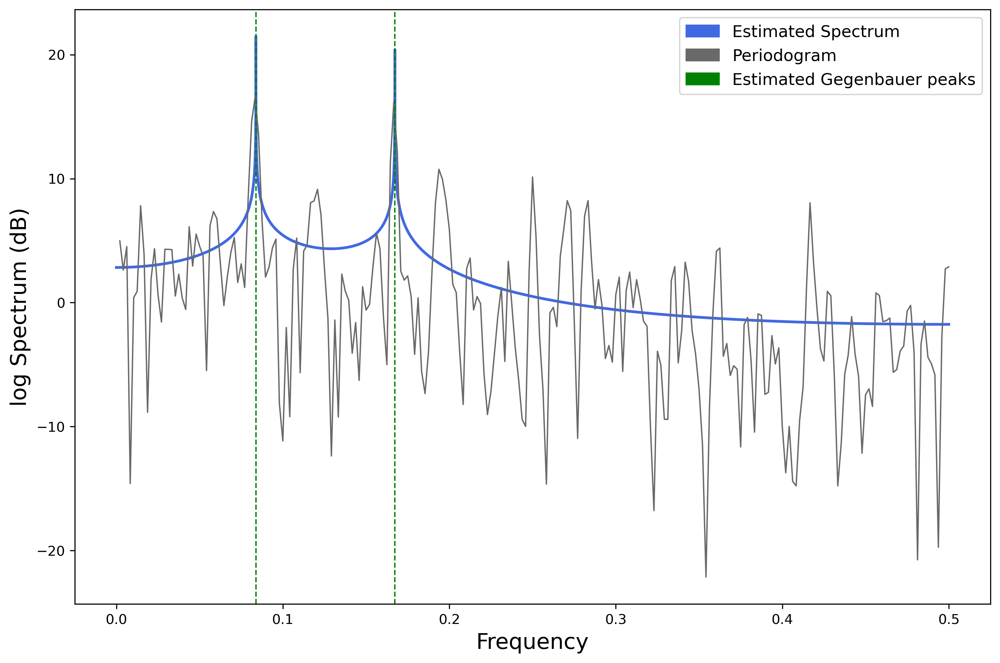

In [1505]:
post_process_smc(particles_init,particles_SMC_cpi_garma_10112_tapered,diagnostics_SMC_cpi_garma_10112_tapered,data,model_spec,
                plot_init = True, param_true = None, S_true = None, stat = 'mode',
                ESS = True, histogram = True, scatter = False, boxplot = True, table = True,  
                SDF = True, BIC = True, L2 = True, plot_settings = plot_features, 
                save = False, display = True, plot_titles=False)
# S_garma_11012, param_true_garma_11012, particles_init

#### Import prior runs from file – not fully functional

In [1550]:
garma_11012_model_path = '/Users/mateipapahagi/Desktop/M4R/M4R Code/GARMA_11012/'
particles_init_garma_11012 = pd.read_csv(garma_11012_model_path + 'GARMA_11012_particles_init_06.05.2022_22h50m.txt',header=None)
particles_SMC_garma_11012 = pd.read_csv(garma_11012_model_path + 'GARMA_11012_particles_SMC_06.05.2022_22h50m.txt',header=None)
with open(garma_11012_model_path + 'GARMA_11012_diagnostics_SMC_06.05.2022_22h50m.json') as json_file:
     diagnostics_SMC_garma_11012 = json.load(json_file)

f_garma_11012, Z_garma_11012 = S_p_vec(x_garma_11012,tapered=True,taper='boxcar')
data_garma_11012 = (f_garma_11012,Z_garma_11012)
model_spec_garma_11012 = (1,1,0,1,2)

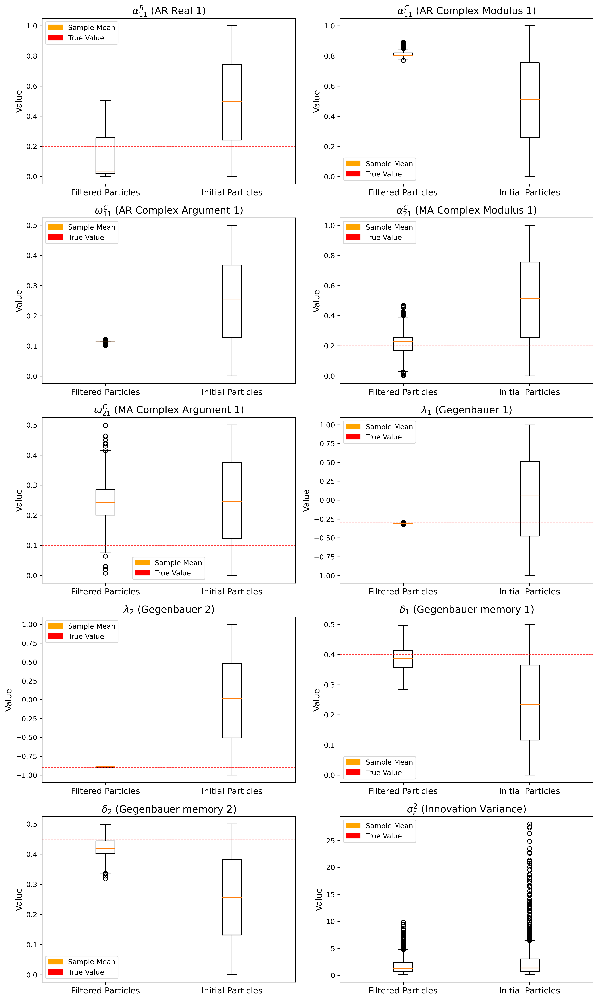

In [1555]:
post_process_smc(particles_init_garma_11012,particles_SMC_garma_11012,diagnostics_SMC_garma_11012,data_garma_11012,model_spec_garma_11012,
                plot_init = True, param_true = param_true_garma_11012, S_true = S_garma_11012, stat = 'mean',
                ESS = False, histogram = False, scatter = False, boxplot = True, table = False,  
                SDF = False, BIC = False, L2 = False, plot_settings = plot_features, 
                save = False, display = True, plot_titles=False)

<a name="535"></a>

### 5.3.5 Observations [^](#outline)

Notes:

<a name="section-6"></a>
# 6: GARMA Simulation [^](#outline)

<a name="61"></a>

## 6.1 AR and MA polynomial reconstruction [^](#outline)

In [1420]:
# Function to build AR and MA polynomials from reciprocal roots
def ARMA_polynomial(xi,polynomial=True,table=True,process='AR',save=False,print=True):
    '''
    xi (list) - vector of reciprocal roots (complex)
    display (bool) - display polynomial
    table (bool) - return table of coefficients
    process (str) - 'AR' or 'MA'
    '''
    # convert list of reciprocal roots to numpy array
    xi = np.array(xi)
    # calculate the polynomial roots (1/xi)
    roots = np.divide(1,xi)
    # multiplication factor in front of resulting polynomial
    multiplier = np.prod(-xi) # alternatively, multiplier = 1/arma_poly_unscaled[-1]
    # resulting polynomial
    arma_poly_unscaled = np.poly(roots)
    # adjust for conjugate roots
    arma_poly = multiplier * arma_poly_unscaled
    n = len(arma_poly) # degree of polynomial #n = arma_poly.shape[0]
    #arma_poly[0] = 1
    # resulting coefficients must be real
    assert (sum(abs(coef.imag) for coef in arma_poly) < 1e-6), 'Not all coefficients are real'
    # convert to real
    arma_poly = np.round(arma_poly.real,3)

    # options to coefficients and the polynomial
    if table == True:
        # make latex coefficient names
        if process == 'AR':
            coef_names = [r'$\phi_{}$'.format(i) for i in range(0,n)]
        if process == 'MA':
            coef_names = [r'$\theta_{}$'.format(i) for i in range(0,n)]
        # make dataframe
        coef_df = pd.DataFrame({process+' Coefficient':coef_names,
        'Value':np.flip(arma_poly)})
        coef_df.index = pd.RangeIndex(start=1, stop=len(coef_names)+1, step=1)
        if print == True: display(Markdown(coef_df.round(3).to_markdown()))
        if save == True:
            coef_df = coef_df.style.format(decimal='.', thousands=',', precision=3)
            with open(process+'_coef'+'.tex', 'w') as tf:
                tf.write(coef_df.to_latex())

    if polynomial == True:
        # make latex polynomial expression
        if process == 'AR':
            monomials_expr = [r'$\Phi(z)=1']+[r'-\phi_{}z^{}'.format(i,i) for i in range(1,n)]+['$']
        if process == 'MA':
            monomials_expr = [r'$\Theta(z)=1']+[r'-\theta_{}z^{}'.format(i,i) for i in range(1,n)]+['$']
        poly_expr = ''.join(monomials_expr)
        # make latex evaluated polynomial
        coef_signs = ['-' if x<0 else '+' for x in arma_poly]
        if process == 'AR':
            monomials_eval = [r'$\Phi(z)=1']+[coef_signs[n-i-1]+str(abs(arma_poly[n-i-1]))+r'z^{}'.format(i) for i in range(1,n)]+['$']
        if process == 'MA':
            monomials_eval = [r'$\Theta(z)=1']+[coef_signs[n-i-1]+str(abs(arma_poly[n-i-1]))+r'z^{}'.format(i) for i in range(1,n)]+['$']
        poly_eval = ''.join(monomials_eval)
        # make dataframe
        poly_df = pd.DataFrame({process+' Polynomial':[poly_expr,poly_eval]})
        poly_df.index = ['Expression','Value']
        if print == True: display(Markdown(poly_df.to_markdown()))
        if save == True:
            poly_df = poly_df.style.format(decimal='.', thousands=',', precision=3)
            with open(process+'_polynomial'+'.tex', 'w') as tf:
                tf.write(poly_df.to_latex())
    
    return(arma_poly)

<a name="62"></a>

## 6.2 ARMA Simulation [^](#outline)

In [1416]:
def ARMA_sim(N,Rp,Cp,Rq,Cq,
            alpha1R=None,alpha1C=None,omega1C=None,
            alpha2R=None,alpha2C=None,omega2C=None,
            polynomial=False,table=False,
            save=False,print=True):
    # direct ARMA simulation using statsmodels.api
    if alpha1R == None: alpha1R = list(np.random.uniform(0,1,Rp))
    if alpha1C == None: alpha1C = list(np.random.uniform(0,1,Cp))
    alpha1 = alpha1R + alpha1C

    omega1R = [0] * Rp
    if omega1C == None: omega1C = list(np.random.uniform(0,1/2,Cp))
    omega1 = omega1R + omega1C

    if alpha2R == None: alpha2R = list(np.random.uniform(0,1,Rq))
    if alpha2C == None: alpha2C = list(np.random.uniform(0,1,Cq))
    alpha2 = alpha2R + alpha2C

    omega2R= [0] * Rq
    if omega2C == None: omega2C = list(np.random.uniform(0,1/2,Cq))
    omega2 = omega2R + omega2C

    AR_xi = xi_builder(alpha1,omega1)
    MA_xi = xi_builder(alpha2,omega2)

    if len(AR_xi) > 0: 
        AR_poly = ARMA_polynomial(AR_xi,polynomial,table,process='AR',save=save,print=print)
        AR_coefs = np.flip(AR_poly)
    else: AR_coefs = np.array([0]) #np.array([])
    if len(MA_xi) > 0:
        MA_poly = ARMA_polynomial(MA_xi,polynomial,table,process='MA',save=save,print=print)
        MA_coefs = np.flip(MA_poly)
    else: MA_coefs = np.array([0]) #np.array([])

    #np.random.seed(123)
    # generate ARMA process of length N
    ARMA_ts = sm.tsa.arma_generate_sample(AR_coefs, MA_coefs, N)

    return ARMA_ts


<a name="63"></a>

## 6.3 General Simulation from Spectrum [^](#outline)

This is the approximate frequency-domain method in Percival (1992).

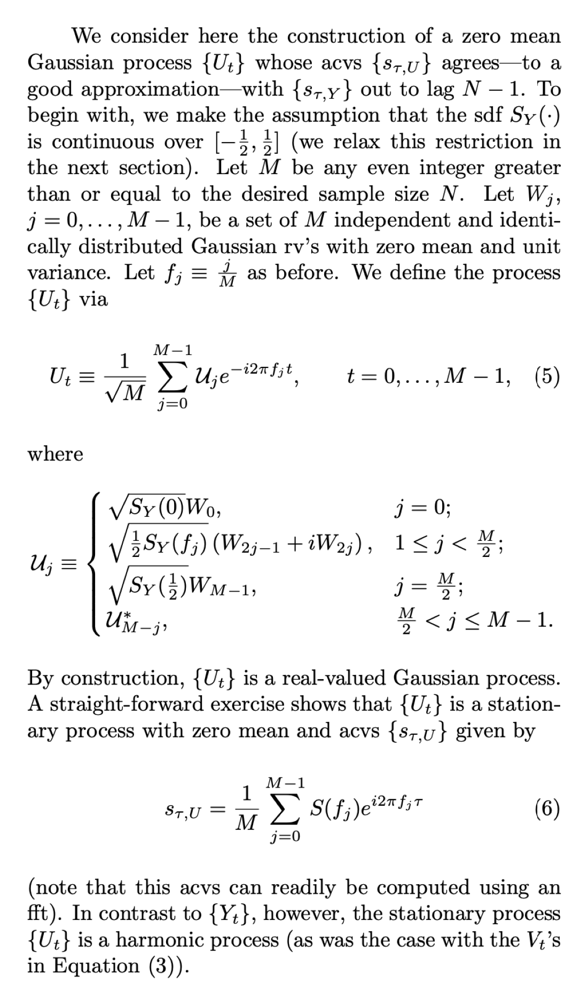

In [93]:
import matplotlib.image as mpimg
image4 = mpimg.imread("Approximate_Freq_Domai_Method.png")
plt.imshow(image4)
plt.axis('off')
plt.show()

Consider the simulated ARMA(3,0,3) data from before. We compute the true spectrum for this data and use it to determine its autocovariance sequence, which we then use to simulate the process using a finite truncation of the white noise process. The methodology is that from Percival (1992).

In [94]:
# function to simulate a realisation of the process
def approx_fd_sim(S):
    '''
    S - the sdf (length M//2)
    W - the white noise process (length M)
    '''
    # M is any even integer >= desired sample size N
    # since we only have N/2+1 values for S (spectrum)
    # we must take M=N
    
    # generate a standard Gaussian white noise
    #if len(S)%2==0: M = 2*len(S)
    M = 2*(len(S)-1)
    W_mean = 0; W_std = 1 # or sqrt(sigma_epsilon_sim)
    W = rng.normal(loc=W_mean, scale=W_std, size=M)

    # double range of Fourier frequencies
    f = np.array([j/M for j in range(0,M)]) #j=0,...,M-1
    # make sure that the first half of f (ranging from 0 to 1/2)
    # is perfectly aligned with S
    assert f[M//2] == 1/2
    assert S[M//2] == S[-1]

    # form U
    U = np.zeros(M,dtype=np.complex_)
    U[0] = np.sqrt(S[0])*W[0]
    # 1<=j<M/2
    for j in range (1,M//2): 
        U[j] = np.sqrt(1/2*S[j])*(W[2*j-1]+1j*W[2*j])
    # j=M/2
    U[M//2] = np.sqrt(S[M//2])*(W[M-1]) 
    # M/2 < j <= M-1
    for j in range (M//2+1,M):
        U[j] = np.conj(U[M-j])
    
    # form V
    V = np.zeros(M,dtype=np.float64)
    for t in range(0,M):
        V[t] = 1/np.sqrt(M)*sum([(U[j]*cmath.exp(-1j*2*pi*f[j]*t)).real for j in range(0,M)])
    
    return V

In [95]:
def spectrum_sim(Rp,Cp,Rq,Cq,k,N,
            alpha1R=None,alpha1C=None,omega1C=None,
            alpha2R=None,alpha2C=None,omega2C=None,
            Lambda=None,delta=None,sigma_epsilon=None):
        
        p = Rp + 2*Cp
        q = Rq + 2*Cq
        # default parameters
        if alpha1R == None: alpha1R = list(np.random.uniform(0,1,Rp))
        if alpha1C == None: alpha1C = list(np.random.uniform(0,1,Cp))
        alpha1 = alpha1R + alpha1C

        omega1R = [0] * Rp
        if omega1C == None: omega1C = list(np.random.uniform(0,1/2,Cp))
        omega1 = omega1R + omega1C

        if alpha2R == None: alpha2R = list(np.random.uniform(0,1,Rq))
        if alpha2C == None: alpha2C = list(np.random.uniform(0,1,Cq))
        alpha2 = alpha2R + alpha2C

        omega2R = [0] * Rq
        if omega2C == None: omega2C = list(np.random.uniform(0,1/2,Cq))
        omega2 = omega2R + omega2C 

        if Lambda == None: Lambda = list(np.random.uniform(-1,1,k))
        if delta == None: delta = list(np.random.uniform(0,1/2,k))
        if sigma_epsilon == None: sigma_epsilon = 1

        # Fourier grid
        f = [j/N for j in range(0,N//2+1)]

        # calculate the spectrum
        S = S_Y_vec(f,alpha1,omega1,alpha2,omega2,
                  Lambda,delta,sigma_epsilon,
                  p,q,k)

        # return the simulation
        return approx_fd_sim(S)

<a name="64"></a>

## 6.4 GARMA Simulation from Functional Form [^](#outline)

To be implemented...

In [96]:
# apply these succesively to Gaussian white noise
def AR_filter(*args):
    pass

def MA_filter(*args):
    pass

def G_filter(*args):
    pass

<a name="65"></a>

## 6.5 Forecasting [^](#outline)

To be implemented...

In [1052]:
# Future Development

<a name="66"></a>

## 6.6 Saving Some Time Series [^](#outline)

In [97]:
# function to save model specification
def save_model(model_spec,alpha1R,alpha1C,omega1C,
                       alpha2R,alpha2C,omega2C,
                       Lambda,delta,sigma_epsilon,
                       file_name = 'coef.csv'):
    Rp,Cp,Rq,Cq,k = model_spec
    # joined parameter list
    param_true = alpha1R+alpha1C+omega1C+alpha2R+alpha2C+omega2C+Lambda+delta+[sigma_epsilon]
    model_dict = {
        'Rp':Rp,'Cp':Cp,'Rq':Rq,'Cq':Cq,'k':k,
        'alpha1R': alpha1R,'alpha1C': alpha1C, 'omega1C': omega1C,
        'alpha2R': alpha2R,'alpha2C': alpha2C,'omega2C': omega2C,
        'lambda': Lambda,'delta': delta, 'sigma_epsilon': sigma_epsilon,
        'param_true': param_true
                }
    with open(file_name,'w') as f:
        w = csv.writer(f)
        w.writerows(model_dict.items())


<a name="661"></a>

### 6.6.1 ARMA(3,3) [^](#outline)

|    | AR Coefficient   |   Value |
|---:|:-----------------|--------:|
|  1 | $\phi_0$         |   1     |
|  2 | $\phi_1$         |   0.256 |
|  3 | $\phi_2$         |   0.643 |
|  4 | $\phi_3$         |  -0.243 |

|            | AR Polynomial                             |
|:-----------|:------------------------------------------|
| Expression | $\Phi(z)=1-\phi_1z^1-\phi_2z^2-\phi_3z^3$ |
| Value      | $\Phi(z)=1+0.256z^1+0.643z^2-0.243z^3$    |

|    | MA Coefficient   |   Value |
|---:|:-----------------|--------:|
|  1 | $\theta_0$       |   1     |
|  2 | $\theta_1$       |  -0.894 |
|  3 | $\theta_2$       |   0.838 |
|  4 | $\theta_3$       |  -0.256 |

|            | MA Polynomial                                     |
|:-----------|:--------------------------------------------------|
| Expression | $\Theta(z)=1-\theta_1z^1-\theta_2z^2-\theta_3z^3$ |
| Value      | $\Theta(z)=1-0.894z^1+0.838z^2-0.256z^3$          |

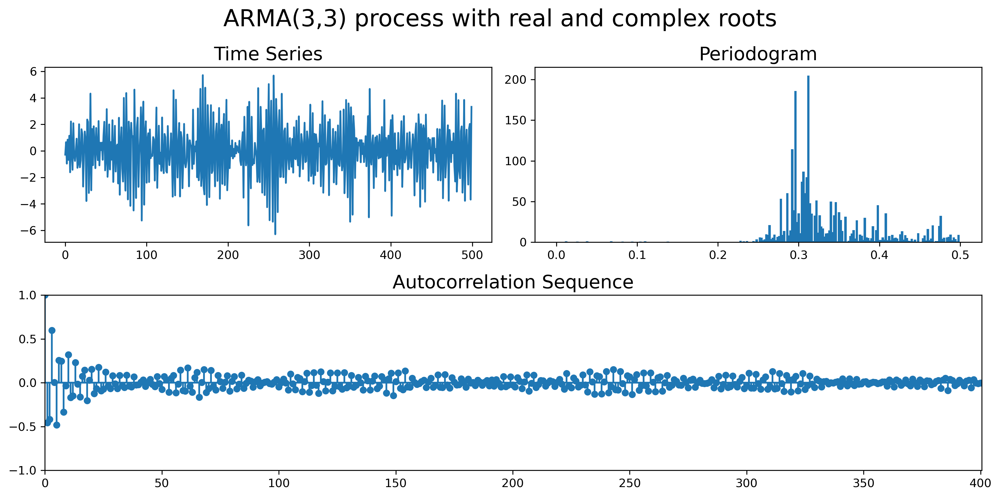

In [1419]:
x_arma_1111 = ARMA_sim(Rp=1,Cp=1,
                    Rq=1,Cq=1,N=500,
                    alpha1R=[0.3],
                    alpha1C=[0.9],
                    omega1C=[0.3],
                    alpha2R=[0.4],
                    alpha2C=[0.8],
                    omega2C=[0.2],
                    polynomial=True,table=True,
                    save=True,print=True)

# standardise the TS
# x_arma_1111 = pre_process_ts(x_arma_1111,normal=False, standard=True, n_differences=0)
# plot the TS, its periodogram, and its acf
ts_plot3(x_arma_1111,n_lags=400,title="ARMA(3,3) process with real and complex roots")

# save the time series and the model specification
# np.savetxt('ARMA_1111_1000.csv', x_arma_1111, delimiter=",")
# save_model((1,1,1,1,0),alpha1R=[0.3],
#                     alpha1C=[0.9],
#                     omega1C=[0.3],
#                     alpha2R=[0.4],
#                     alpha2C=[0.8],
#                     omega2C=[0.2],
#                     Lambda=[],
#                     delta=[],
#                     sigma_epsilon=1,
#                     file_name='x_arma_1111_coef')

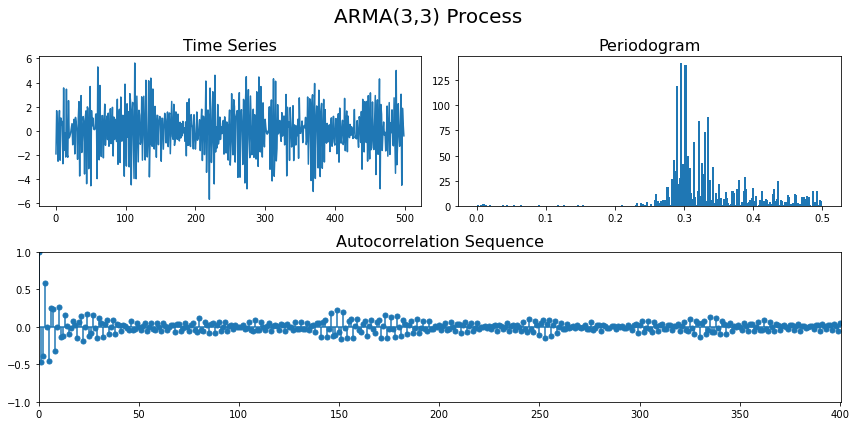

In [186]:
# alternatively:
x_arma_1111_bis = spectrum_sim(Rp=1,Cp=1,
                              Rq=1,Cq=1,
                              k=0,N=500,
                              alpha1R=[0.3],
                              alpha1C=[0.9],
                              omega1C=[0.3],
                              alpha2R=[0.4],
                              alpha2C=[0.8],
                              omega2C=[0.2],
                              Lambda=[],
                              delta=[],
                              sigma_epsilon=1)
# standardise the TS
# x_arma_1111_bis = pre_process_ts(x_arma_1111_bis,normal=False, standard=True, n_differences=0)
# plot the TS, its periodogram, and its acf
ts_plot3(x_arma_1111_bis,n_lags=400,title="ARMA(3,3) Process")

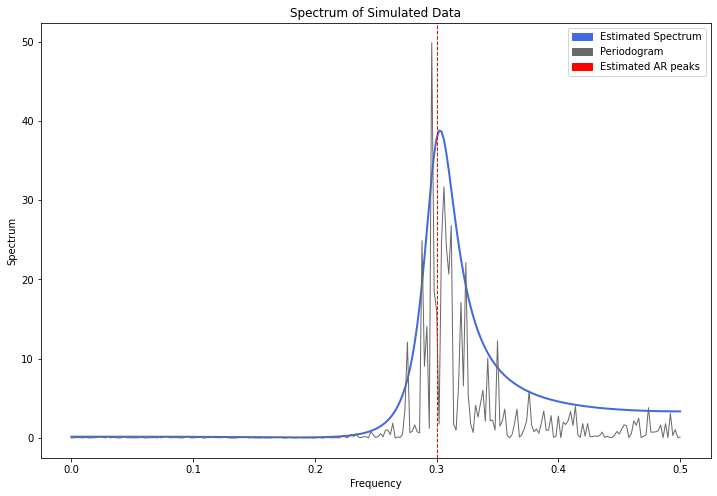

In [188]:
# Calculate Spectrum, Periodogram, and ACVS for the simulated data

# periodogram
f_arma_1111, Z_arma_1111 = S_p_vec(x_arma_1111)

# spectrum
S_arma_1111 = S_Y_vec(f_arma_1111,
                  alpha1=[0.3,0.9],
                  omega1=[0,0.3],
                  alpha2=[0.4,0.8],
                  omega2=[0,0.2],
                  Lambda=[],
                  delta=[],
                  sigma_epsilon=1,
                  p=3,q=3,k=0)

#np.savetxt('ARMA_1111_sdf.csv', S_arma_1111 , delimiter=",")

# acvs estimated from spectrum via Inverse DFT (FFT algorithm)
acvs_arma_1111 = np.fft.irfft(S_arma_1111)

# plot periodogram against spectrum
plot_SDF(f_arma_1111,S_arma_1111,with_peaks=True,Lambda=[],alpha1C=[0.9],omega1C=[0.3],log=False,box=False,title='Spectrum of Simulated Data',periodogram_vals=Z_arma_1111)
plt.show()

<a name="662"></a>

### 6.6.2 ARFIMA(0,0.4,0) [^](#outline)

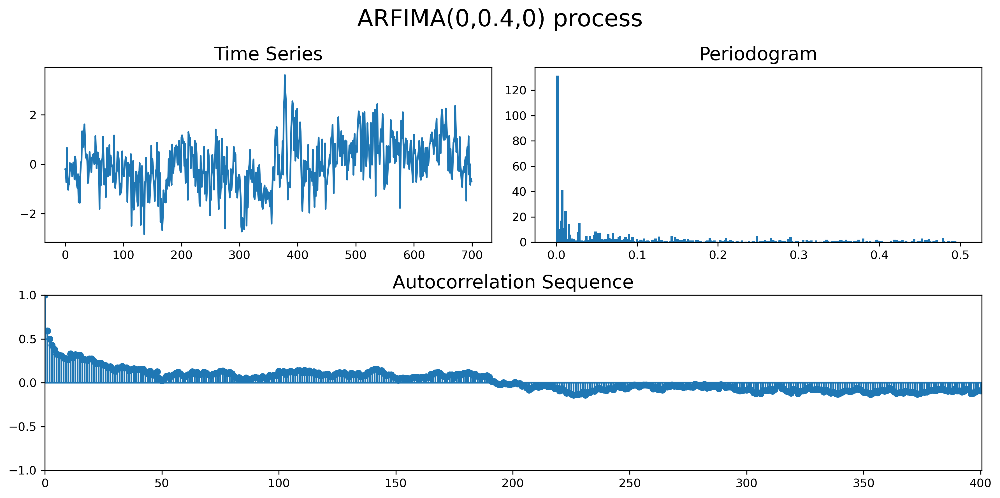

In [1187]:
x_arfima_04 = pd.read_csv("~/Desktop/M4R/M4R Data/Simulated Data/ARFIMA_04_700.csv")
x_arfima_04 =np.array(x_arfima_04['x'])
# standardise the TS
x_arfima_04 = pre_process_ts(x_arfima_04,normal=False, standard=True, n_differences=0)
# plot the TS, its periodogram, and its acf
ts_plot3(x_arfima_04,n_lags=400,title="ARFIMA(0,0.4,0) process")

<a name="663"></a>

### 6.6.3 1-Factor Gegenbauer [^](#outline)

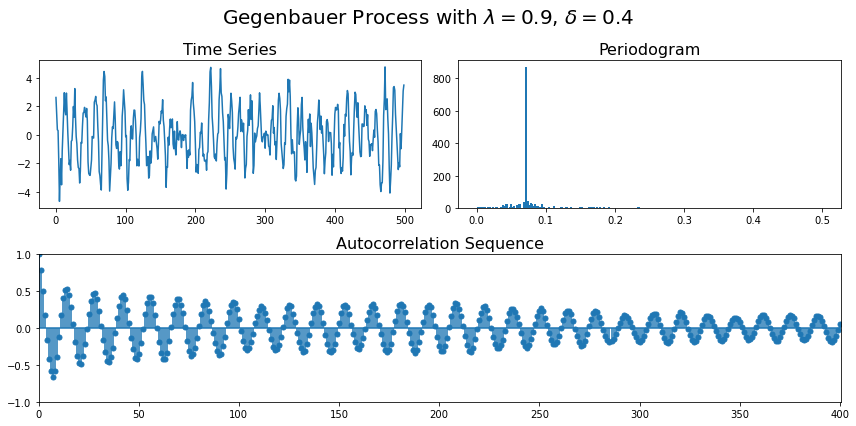

In [190]:
x_gegenbauer_1 = spectrum_sim(Rp=0,Cp=0,
                              Rq=0,Cq=0,
                              k=1,N=500,#=672,#700
                              alpha1R=[],
                              alpha1C=[],
                              omega1C=[],
                              alpha2R=[],
                              alpha2C=[],
                              omega2C=[],
                              Lambda=[0.9],#[0.889]
                              delta=[0.4],#[0.428]
                              sigma_epsilon=None)
# standardise the TS
#x_gegenbauer_1 = pre_process_ts(x_gegenbauer_1,normal=False, standard=True, n_differences=0)
# plot the TS, its periodogram, and its acf
ts_plot3(x_gegenbauer_1,n_lags=400,title="Gegenbauer Process with $\lambda=0.9$, $\delta=0.4$")
# save the time series
# np.savetxt('Gegenbauer_1_1000.csv', x_gegenbauer_1 , delimiter=",")
# save_model((0,0,0,0,1),alpha1R=[],
#                     alpha1C=[],
#                     omega1C=[],
#                     alpha2R=[],
#                     alpha2C=[],
#                     omega2C=[],
#                     Lambda=[0.9],
#                     delta=[0.4],
#                     sigma_epsilon=1,
#                     file_name='x_gegenbauer_1_coef')

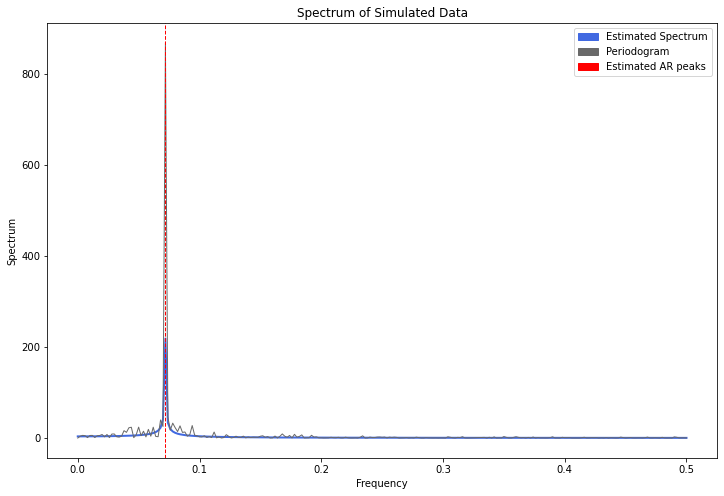

In [191]:
# Calculate Spectrum, Periodogram, and ACVS for the simulated data

# periodogram
f_gegenbauer_1, Z_gegenbauer_1 = signal.periodogram(x_gegenbauer_1,window='boxcar',scaling='density')

# spectrum
S_gegenbauer_1 = S_Y_vec(f_gegenbauer_1,
                  alpha1=[],
                  omega1=[],
                  alpha2=[],
                  omega2=[],
                  Lambda=[0.9],
                  delta=[0.4],
                  sigma_epsilon=1,
                  p=0,q=0,k=1)
#np.savetxt('Gegenbauer_1_sdf.csv', S_gegenbauer_1 , delimiter=",")

# acvs estimated from spectrum via Inverse DFT (FFT algorithm)
acvs_gegenbauer_1 = np.fft.irfft(S_gegenbauer_1)

# plot periodogram against spectrum
plot_SDF(f_gegenbauer_1,S_gegenbauer_1,with_peaks=True,Lambda=[0.9],alpha1C=[],omega1C=[],log=False,box=False,title='Spectrum of Simulated Data',periodogram_vals=Z_gegenbauer_1)
plt.show()

<a name="664"></a>

### 6.6.4 GARMA(5,1,3) [^](#outline)

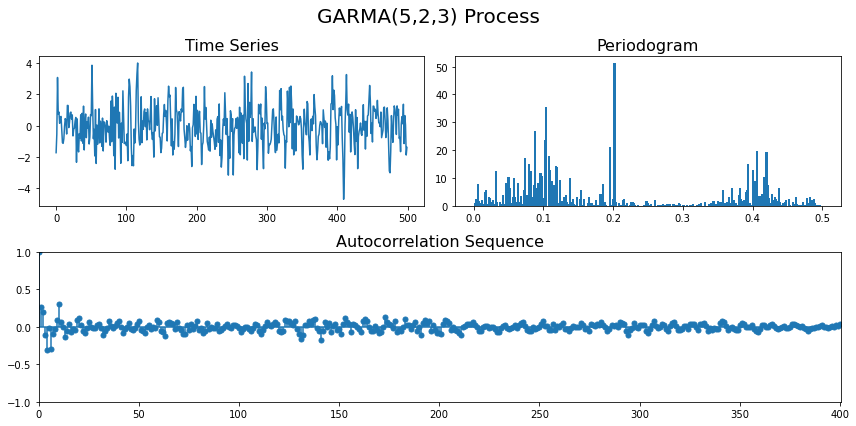

In [1172]:
x_garma_12111 = spectrum_sim(Rp=1,Cp=2,
                              Rq=1,Cq=1,
                              k=1,N=500,
                              alpha1R=[0.2],
                              alpha1C=[0.9,0.85],
                              omega1C=[0.1,0.4],
                              alpha2R=[0.3],
                              alpha2C=[0.1],
                              omega2C=[0.25],
                              Lambda=[0.3],
                              delta=[0.35],
                              sigma_epsilon=None)
# standardise the TS
#x_garma_11111 = pre_process_ts(x_garma_12112,normal=False, standard=True, n_differences=0)
# plot the TS, its periodogram, and its acf
ts_plot3(x_garma_12111,n_lags=400,title="GARMA(5,2,3) Process")
# save the time series
# np.savetxt('garma_12111_500.csv', x_garma_12111 , delimiter=",")
# save_model((1,2,1,1,1),alpha1R=[0.2],
#                     alpha1C=[0.9,0.85],
#                     omega1C=[0.1,0.4],
#                     alpha2R=[0.3],
#                     alpha2C=[0.1],
#                     omega2C=[0.25],
#                     Lambda=[0.3],
#                     delta=[0.35],
#                     sigma_epsilon=1,
#                     file_name='x_garma_12111_coef')

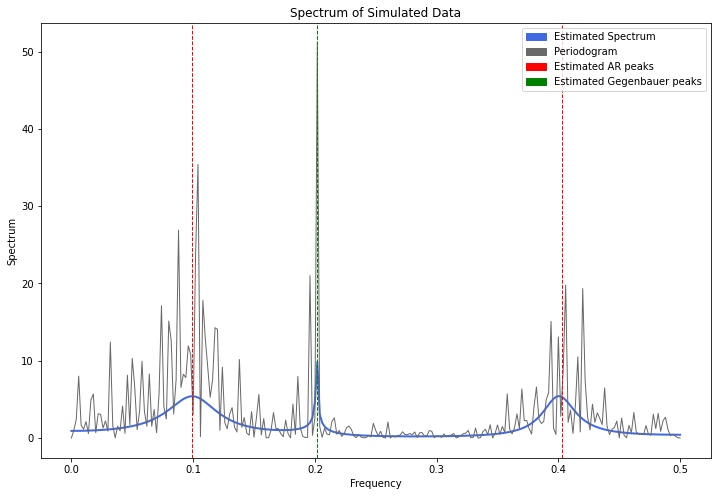

In [1176]:
# Calculate Spectrum, Periodogram, and ACVS for the simulated data

# periodogram
f_garma_12111, Z_garma_12111 = signal.periodogram(x_garma_12111,window='boxcar',scaling='density')

# spectrum
S_garma_12111 = S_Y_vec(f_garma_12111,
                  alpha1=[0.2,0.9,0.85],
                  omega1=[0,0.1,0.4],
                  alpha2=[0.3,0.1],
                  omega2=[0,0.25],
                  Lambda=[0.3],
                  delta=[0.35],
                  sigma_epsilon=1,
                  p=5,q=3,k=1)

#np.savetxt('GARMA_12111_sdf.csv', S_garma_12111 , delimiter=",")

# acvs estimated from spectrum via Inverse DFT (FFT algorithm)
acvs_garma_12111 = np.fft.irfft(S_garma_12111)

# plot periodogram against spectrum
plot_SDF(f_garma_12111,S_garma_12111,with_peaks=True,Lambda=[0.3],alpha1C=[0.9,0.85],omega1C=[0.1,0.4],log=False,box=False,title='Spectrum of Simulated Data',periodogram_vals=Z_garma_12111)
plt.show()

<a name="664"></a>

### 6.6.5 GARMA(3,2,2) [^](#outline)

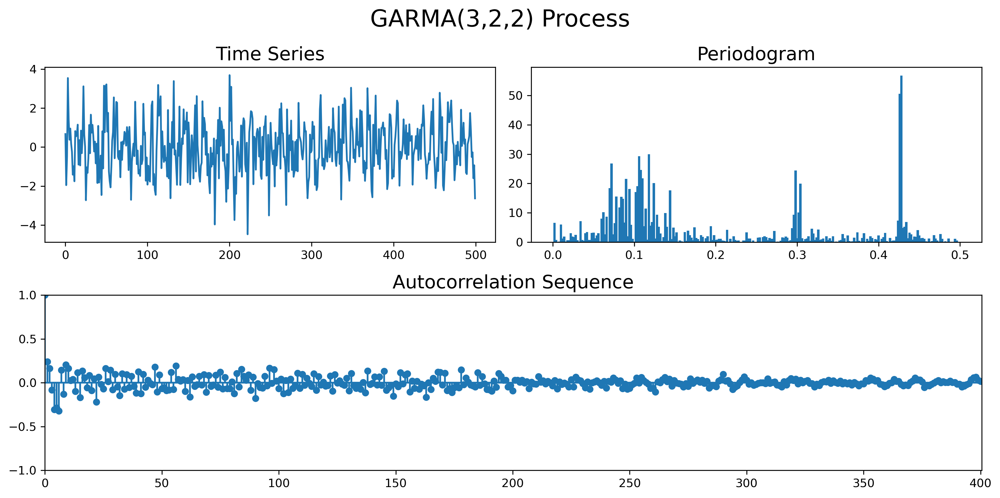

In [245]:
x_garma_11012 = spectrum_sim(Rp=1,Cp=1,
                              Rq=0,Cq=1,
                              k=2,N=500,
                              alpha1R=[0.2],
                              alpha1C=[0.9],
                              omega1C=[0.1],
                              alpha2R=[],
                              alpha2C=[0.2],
                              omega2C=[0.1],
                              Lambda=[-0.3,-0.9],
                              delta=[0.4,0.45],
                              sigma_epsilon=None)
# standardise the TS
#x_garma_11111 = pre_process_ts(x_garma_12112,normal=False, standard=True, n_differences=0)
# plot the TS, its periodogram, and its acf
ts_plot3(x_garma_11012,n_lags=400,title="GARMA(3,2,2) Process")
# save the time series


In [248]:
# np.savetxt('garma_11012_500.csv', x_garma_11012 , delimiter=",")
# save_model((1,1,0,1,2),alpha1R=[0.2],
#                     alpha1C=[0.9],
#                     omega1C=[0.1],
#                     alpha2R=[],
#                     alpha2C=[0.2],
#                     omega2C=[0.1],
#                     Lambda=[-0.3,-0.9],
#                     delta=[0.4,0.45],
#                     sigma_epsilon=1,
#                     file_name='x_garma_11012_coef')

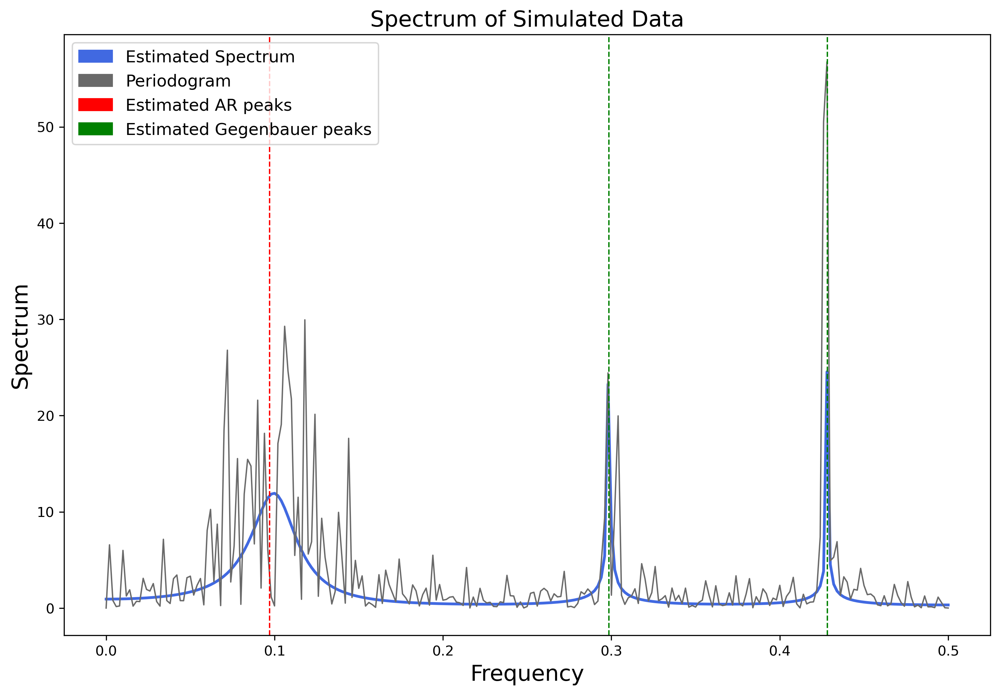

In [249]:
# Calculate Spectrum, Periodogram, and ACVS for the simulated data

# periodogram
f_garma_11012, Z_garma_11012 = signal.periodogram(x_garma_11012,window='boxcar',scaling='density')

# spectrum
S_garma_11012 = S_Y_vec(f_garma_11012,
                  alpha1=[0.2,0.9],
                  omega1=[0,0.1],
                  alpha2=[0.2],
                  omega2=[0.1],
                  Lambda=[-0.3,-0.9],
                  delta=[0.45,0.4],
                  sigma_epsilon=1,
                  p=3,q=2,k=2)

#np.savetxt('GARMA_11012_sdf.csv', S_garma_11012 , delimiter=",")

# acvs estimated from spectrum via Inverse DFT (FFT algorithm)
acvs_garma_11012 = np.fft.irfft(S_garma_11012)

# plot periodogram against spectrum
plot_SDF(f_garma_11012,S_garma_11012,with_peaks=True,Lambda=[-0.3,-0.9],alpha1C=[0.85],omega1C=[0.1],log=False,box=False,title='Spectrum of Simulated Data',periodogram_vals=Z_garma_11012)
plt.show()

<a name="section-7"></a>
# 7. Other Figures from Article [^](#outline)

In [743]:
figure_output_path = '/Users/mateipapahagi/Desktop/M4R/M4R Article+Figures'

### Figure 2.1: ACF plot of ARMA vs ARFIMA vs Gegenbauer

In [1261]:
# processes:
x_arma_0110 = spectrum_sim(Rp=0,Cp=1,
                              Rq=1,Cq=0,
                              k=0,N=500,
                              alpha1R=[],
                              alpha1C=[0.95],
                              omega1C=[0.2],
                              alpha2R=[0.5],
                              alpha2C=[],
                              omega2C=[],
                              Lambda=[],
                              delta=[],
                              sigma_epsilon=None)
x_garma_00101 = spectrum_sim(Rp=0,Cp=0,
                              Rq=1,Cq=0,
                              k=1,N=500,
                              alpha1R=[],
                              alpha1C=[],
                              omega1C=[],
                              alpha2R=[0.15],
                              alpha2C=[],
                              omega2C=[],
                              Lambda=[0.9],
                              delta=[0.4],
                              sigma_epsilon=None)

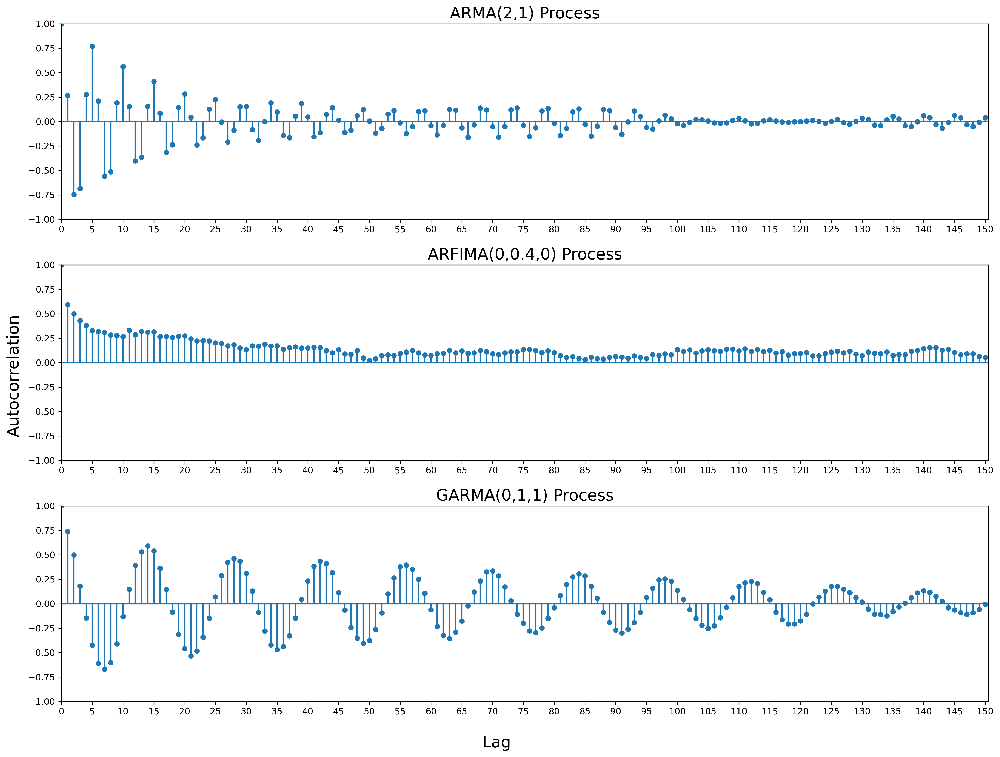

In [1270]:
# plot acf of ARMA vs ARFIMA vs Gegenbauer
fig = plt.figure(figsize=(16, 12))
max_lag = 150
# ARMA(2,2)
ax1 = plt.subplot(3,1,1)
plot_acf(x_arma_0101,lags=max_lag,ax=ax1,bartlett_confint=False,alpha=0.99)
plt.margins(x=0)
plt.xticks(np.arange(0, max_lag+1, 5))
# ARFIMA(0,0.4,0)
ax2 = plt.subplot(3,1,2)
plot_acf(x_arfima_04,lags=max_lag,ax=ax2,bartlett_confint=False,alpha=0.99)
plt.margins(x=0)
plt.xticks(np.arange(0, max_lag+1, 5))
# Gegenbauer
ax3 = plt.subplot(3,1,3)
plot_acf(x_garma_00001,lags=max_lag,ax=ax3,bartlett_confint=False,alpha=0.99)
plt.margins(x=0)
plt.xticks(np.arange(0, max_lag+1, 5))
# titles and other configs
ax1.set_title('ARMA(2,1) Process',fontsize=18)
ax2.set_title('ARFIMA(0,0.4,0) Process',fontsize=18)
ax3.set_title('GARMA(0,1,1) Process',fontsize=18)
#plt.suptitle('Autocorrelation Sequence', fontsize=20)
fig.supxlabel('Lag',fontsize=18)
fig.supylabel('Autocorrelation',fontsize=18)
plt.tight_layout(pad=1.5, h_pad=1.5, w_pad=1.5)
#plt.savefig(figure_output_path + '/ARMA_vs_ARFIMA_vs_Gegenbauer_ACF_new.png')
plt.show()

### Figure 2.2: AR vs Gegenbauer Peaks

Same GARMA(3,2,2) process as used in section 6.2.1.

In [1181]:
# redefine high-res frequency grid to see the infinite peaks
f_garma_11012_high_res = np.linspace(0,0.5,100000)
S_garma_11012_high_res = S_Y_vec(f_garma_11012_high_res,
                  alpha1=[0.2,0.9],
                  omega1=[0,0.1],
                  alpha2=[0.2],
                  omega2=[0.1],
                  Lambda=[-0.3,-0.9],
                  delta=[0.45,0.4],
                  sigma_epsilon=1,
                  p=3,q=2,k=2)

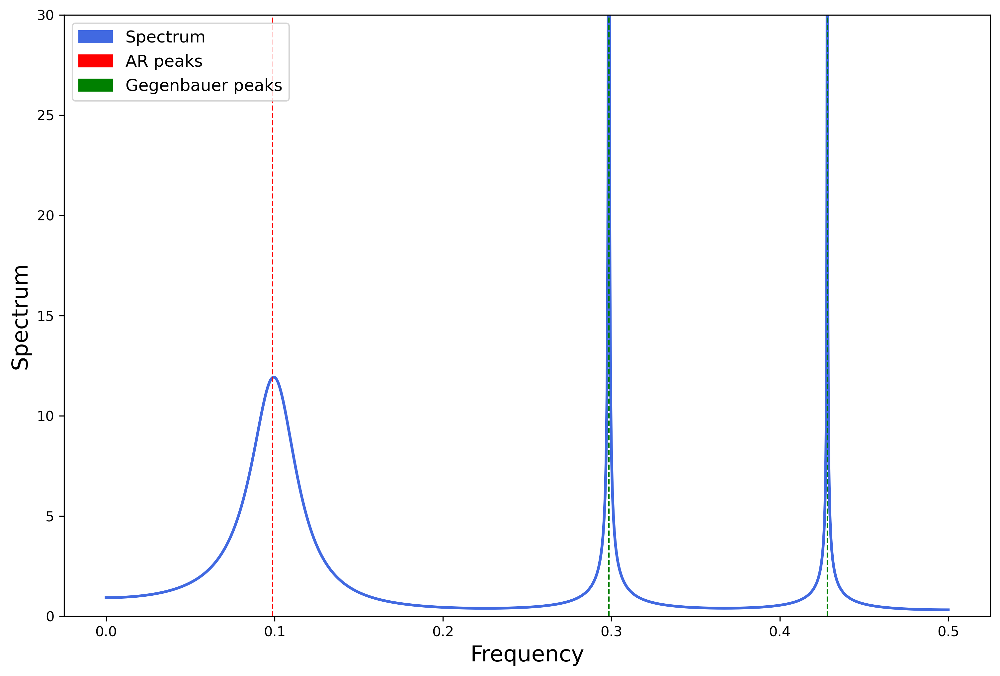

In [1184]:
plot_SDF(f_garma_11012_high_res,S_garma_11012_high_res,with_peaks=True,
Lambda=[-0.3,-0.9],alpha1C=[0.9],omega1C=[0.1],title='',log=False,estimated_legend=False)
plt.ylim(0,30)
plt.savefig(figure_output_path + '/AR_vs_Gegenbauer_peaks.png')
plt.show()

### Figure 3.1: AR(4) autocorrelation and periodogram

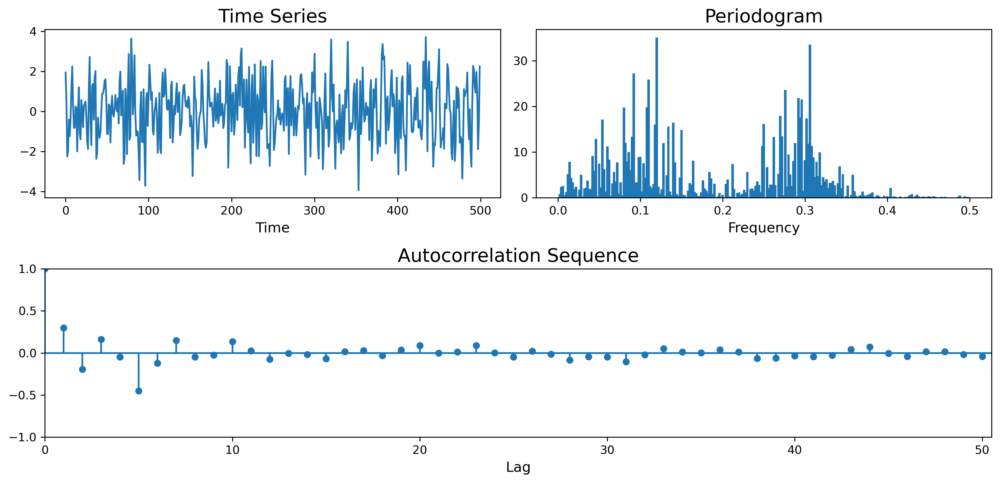

In [1535]:
x_ar_2 = spectrum_sim(Rp=0,Cp=2,
                        Rq=0,Cq=0,
                        k=0,N=500,
                        alpha1R=[],
                        alpha1C=[0.9,0.8],
                        omega1C=[0.3,0.1],
                        alpha2R=[],
                        alpha2C=[],
                        omega2C=[],
                        Lambda=[],
                        delta=[],
                        sigma_epsilon=None)

# standardise the TS
#x_ar_11 = pre_process_ts(x_ar_11,normal=False, standard=True, n_differences=0)
# plot the TS, its periodogram, and its acf
ts_plot3(x_ar_2,n_lags=50,title='')#"AR(4) process with complex roots")
#plt.savefig(figure_output_path + '/AR4_process.png')

### Figure 6.7: Comparison of Perodogram and Tapered Estimator

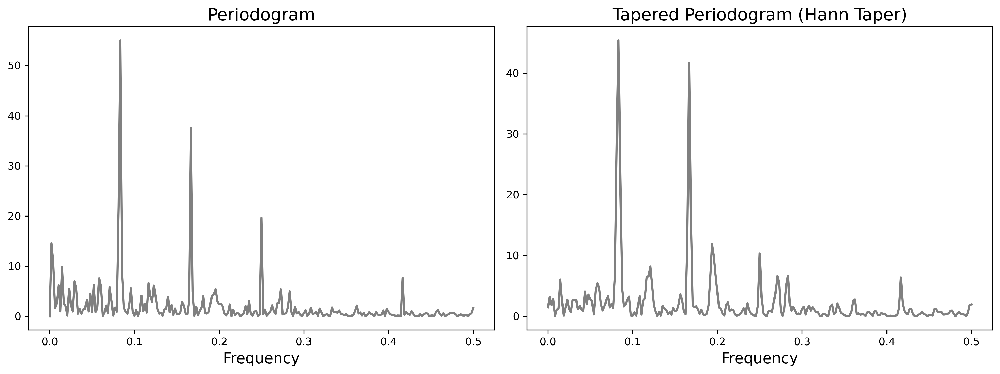

In [ ]:
f_per, Z_per = S_p_vec(y,tapered=True,taper='boxcar') 
f_tapered, Z_tapered = S_p_vec(y,tapered=True,taper='hann') 
#S_p_vec(y,tapered=False) #S_p_vec(y,tapered=True,taper='hann')
plt.figure(figsize=(13.2, 5))

ax1 = plt.subplot(1,2,1)
ax1.plot(f_per, Z_per, linewidth=2,color='gray')
ax1.set_title('Periodogram',fontsize=16)
ax1.set_xlabel('Frequency',fontsize=14)

ax2 = plt.subplot(1,2,2)
ax2.plot(f_tapered, Z_tapered, linewidth=2,color='gray')
ax2.set_title('Tapered Periodogram (Hann Taper)',fontsize=16)
ax2.set_xlabel('Frequency',fontsize=14)

plt.tight_layout()

### Figure A.1: Distributions

/var/folders/4k/p7n1kyzs49l7lybkfc5wdl8m0000gn/T/ipykernel_727/3508162669.py:7: RuntimeWarning: divide by zero encountered in double_scalars
  return (beta**alpha)/gamma(alpha)*(1/x)**(alpha+1)*exp(-beta/x)
/var/folders/4k/p7n1kyzs49l7lybkfc5wdl8m0000gn/T/ipykernel_727/3508162669.py:7: RuntimeWarning: invalid value encountered in double_scalars
  return (beta**alpha)/gamma(alpha)*(1/x)**(alpha+1)*exp(-beta/x)


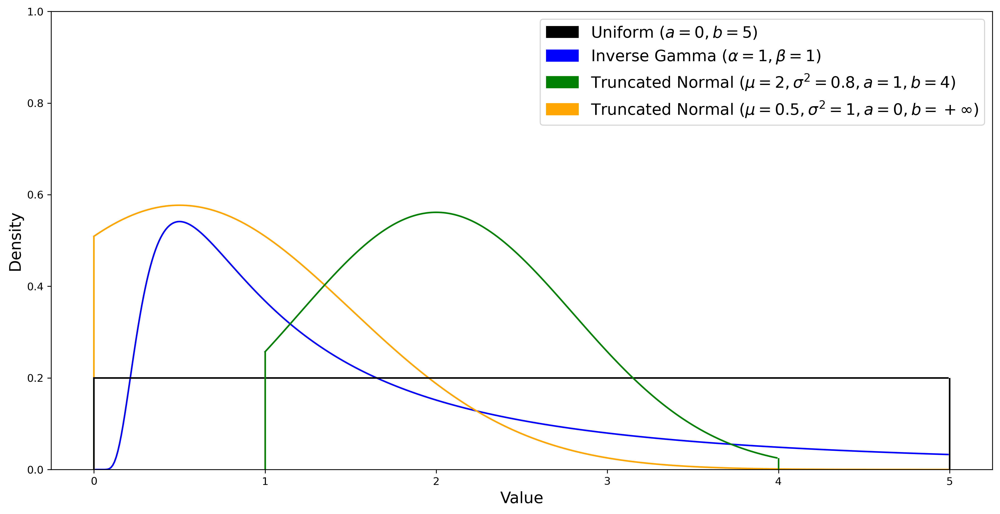

In [744]:
distrib_range = np.arange(0,5,0.01)
distrib_range1 = np.arange(1,4,0.01)
color_vals = ['black','blue','green','orange']
label_vals = [r'Uniform $(a=0,b=5)$',r'Inverse Gamma $(\alpha=1,\beta=1)$',r'Truncated Normal $(\mu=2,\sigma^2=0.8,a=1,b=4)$',r'Truncated Normal $(\mu = 0.5,\sigma^2=1,a=0,b=+\infty)$']
plt.figure(figsize=(16, 8))
# InvGamma(1,1)
plt.plot(distrib_range,[invgamma_pdf(x,1,1) for x in distrib_range],color=color_vals[1])
# Yellow Truncated Normal (range [0,+inf], location 0.5, std 1)
plt.plot(distrib_range,[truncnormal_pdf(x,0,+np.inf,0.5,1) for x in distrib_range],color=color_vals[3])
plt.vlines(x=0, ymin=0, ymax=truncnormal_pdf(0,0,+np.inf,0.5,1), color=color_vals[3])
# Black: Uniform(0,5)
plt.plot(distrib_range,[uniform_pdf(0,5) for x in distrib_range],color=color_vals[0])
plt.vlines(x=0, ymin=0, ymax=1/5, color=color_vals[0])
plt.vlines(x=5, ymin=0, ymax=1/5, color=color_vals[0])
# Green: Truncated Normal (range [1,4], location 2, std 0.8)
plt.plot(distrib_range1,[truncnormal_pdf(x,1,4,2,0.8) for x in distrib_range1],color=color_vals[2])
plt.vlines(x=1, ymin=0, ymax=truncnormal_pdf(1,1,4,2,0.8), color=color_vals[2])
plt.vlines(x=4, ymin=0, ymax=truncnormal_pdf(4,1,4,2,0.8), color=color_vals[2])

col_legends = [mpatches.Patch(color=color_vals[i], label=label_vals[i]) for i in range(4)]  
plt.legend(handles = col_legends, prop={'size': 15})
plt.ylim(0,1)
plt.xlabel('Value',size=15)
plt.ylabel('Density',size=15)
fig.tight_layout()
#plt.savefig(figure_output_path + '/distribution_examples_new.png')


### Figure A.2: Tapering

In [747]:
def Hanning(f,N):
    return np.array([np.abs(sum([np.hanning(N)[t]*cmath.exp(-1j*2*pi*f*t) for t in range(1,N)]))**2 for f in f])

In [803]:
def freq_response(N,window_type='hann'):
    if window_type == 'hann':
        window = signal.windows.hann(N)
    elif window_type == 'boxcar':
        window = signal.windows.boxcar(N)
    A = fft(window, 2048) / (len(window)/2.0)
    freq = np.linspace(-0.5, 0.51, len(A))
    response = np.abs(fftshift(A / abs(A).max()))
    response = 20 * np.log10(np.maximum(response, 1e-10))
    return freq, response

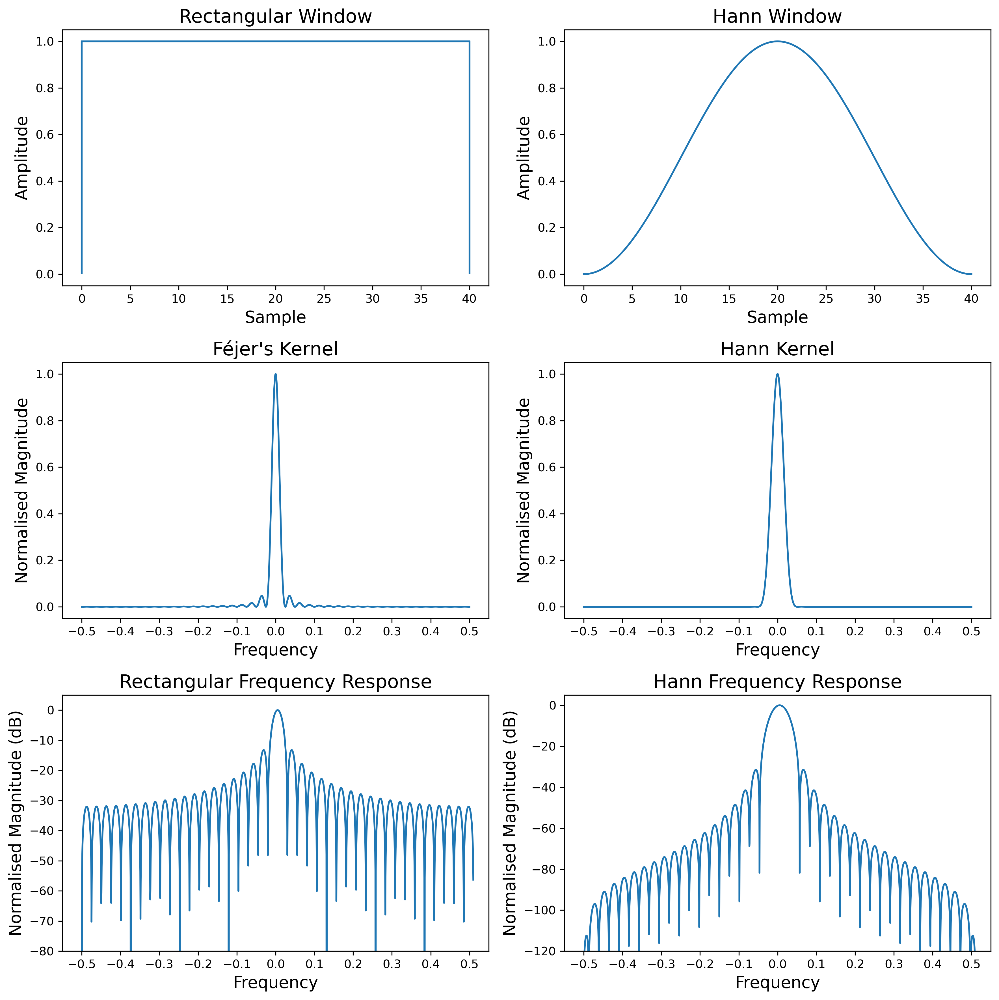

In [811]:
fig, ((ax11, ax21), (ax12,ax22), (ax13, ax23)) = plt.subplots(3, 2, figsize=(12,12))
#fig.suptitle('Tapering and Spectral Leakage (N=8)',fontsize=16)
N=40
# 1st row
ax11.plot(np.linspace(0,N,2048),[1 for x in np.linspace(0,N,2048)])
ax11.vlines(x=0, ymin=0, ymax=1)
ax11.vlines(x=N, ymin=0, ymax=1)
ax11.set_title('Rectangular Window',size=16)
ax11.set_ylabel('Amplitude',size=14)
ax11.set_xlabel('Sample',size=14)

ax21.plot(np.linspace(0,N,2048),np.hanning(2048))
ax21.set_title('Hann Window',size=16)
ax21.set_ylabel('Amplitude',size=14)
ax21.set_xlabel('Sample',size=14)

# 2nd row
ax12.plot(np.linspace(-1/2,1/2,2048),Fejer(np.linspace(-1/2,1/2,2048),N=N)/N)
ax12.set_title("Féjer's Kernel",size=16)
ax12.set_xlim(-0.55,0.55)
ax12.xaxis.set_ticks(np.arange(-0.5, 0.6, 0.1))
ax12.set_ylabel('Normalised Magnitude',size=14)
ax12.set_xlabel('Frequency',size=14)

ax22.plot(np.linspace(-1/2,1/2,2048),Hanning(np.linspace(-1/2,1/2,2048),N=N)/np.max(Hanning(np.linspace(-1/2,1/2,2048),N=N)))
ax22.set_title("Hann Kernel",size=16)
ax22.set_xlim(-0.55,0.55)
ax22.xaxis.set_ticks(np.arange(-0.5, 0.6, 0.1))
ax22.set_ylabel('Normalised Magnitude',size=14)
ax22.set_xlabel('Frequency',size=14)

# 3rd row
ax13.plot(freq_response(N,window_type='boxcar')[0],freq_response(N,window_type='boxcar')[1])
ax13.set_title("Rectangular Frequency Response",size=16)
ax13.set_ylim(-80,5)
ax13.set_xlim(-0.55,0.55)
ax13.xaxis.set_ticks(np.arange(-0.5, 0.6, 0.1))
ax13.set_ylabel('Normalised Magnitude (dB)',size=14)
ax13.set_xlabel('Frequency',size=14)

ax23.plot(freq_response(N,window_type='hann')[0],freq_response(N,window_type='hann')[1])
ax23.set_title("Hann Frequency Response",size=16)
ax23.set_ylim(-120,5)
ax23.set_xlim(-0.55,0.55)
ax23.xaxis.set_ticks(np.arange(-0.5, 0.6, 0.1))
ax23.set_ylabel('Normalised Magnitude (dB)',size=14)
ax23.set_xlabel('Frequency',size=14)

plt.tight_layout(pad=1.5, h_pad=1.2, w_pad=1.2)
plt.savefig(figure_output_path + '/taper_examples_new.png')

### Table with AR and MA coefs and polynomials for the GARMA(3,2,2) model

In [1428]:
garma_11012_model_path = '/Users/mateipapahagi/Desktop/M4R/M4R Code/GARMA_11012/'
summary_bic_loglik_garma_11012 = pd.read_csv(garma_11012_model_path + 'GARMA_11012_summary_bic_loglik_06.05.2022_22h50m.txt',header=None)
param_est_garma_11012=json.loads(summary_bic_loglik_garma_11012.iloc[0,1])
param_est_garma_11012

[0.10863468927814544,
 0.8122956839050915,
 0,
 0.114696964073248,
 0.21248810520350953,
 0.2442261390509512,
 -0.30648799681219896,
 -0.8936501980907974,
 0.38549974473443066,
 0.4204388618493374,
 1.765325300520516]

In [1429]:
x_arma_1101 = ARMA_sim(Rp=1,Cp=1,
                    Rq=0,Cq=1,N=500,
                    alpha1R=[0.10863468927814544],
                    alpha1C=[0.8122956839050915],
                    omega1C=[0.114696964073248],
                    alpha2R=[],
                    alpha2C=[0.21248810520350953],
                    omega2C=[0.2442261390509512],
                    polynomial=True,table=True,
                    save=False,print=True)

|    | AR Coefficient   |   Value |
|---:|:-----------------|--------:|
|  1 | $\phi_0$         |   1     |
|  2 | $\phi_1$         |  -1.329 |
|  3 | $\phi_2$         |   0.792 |
|  4 | $\phi_3$         |  -0.072 |

|            | AR Polynomial                             |
|:-----------|:------------------------------------------|
| Expression | $\Phi(z)=1-\phi_1z^1-\phi_2z^2-\phi_3z^3$ |
| Value      | $\Phi(z)=1-1.329z^1+0.792z^2-0.072z^3$    |

|    | MA Coefficient   |   Value |
|---:|:-----------------|--------:|
|  1 | $\theta_0$       |   1     |
|  2 | $\theta_1$       |  -0.015 |
|  3 | $\theta_2$       |   0.045 |

|            | MA Polynomial                         |
|:-----------|:--------------------------------------|
| Expression | $\Theta(z)=1-\theta_1z^1-\theta_2z^2$ |
| Value      | $\Theta(z)=1-0.015z^1+0.045z^2$       |